# Funções Base

In [1]:
from matplotlib.pyplot import *
import numpy as np
import h5py
from Data_Core.experiment import *
from Data_Core.digital_twin import *
from tqdm import tqdm
from scipy.ndimage import gaussian_filter
import sklearn
%load_ext autoreload
from skimage import feature
import scipy
from skimage.filters import gabor
from skimage.filters import threshold_otsu

In [2]:
#find_index = lambda wavelenghts, w : np.argmin(np.abs(wavelenghts - w))

def find_index(wavelenghts,w):
    return np.argmin(np.abs(wavelenghts - w))

In [3]:
def Raman_data_loader(filename):

    with h5py.File(filename, 'a') as output_file:
         
        properties = output_file['properties']
        
        exp_properties = {'step_size' : np.array(properties['step_size'])[0],
                          'speed' : np.array(properties['speed']),
                          'n_points' : np.array(properties['n_points'])
            }
        
        wavelengths = np.array(output_file['properties']['x_data'])
        
        
        spot_numbers = [int(s.split('_')[-1]) for s in list(output_file['data'].keys()) if 'spot' in s ]
        
        Nx,Ny = output_file['properties']['n_points'][0], output_file['properties']['n_points'][1]
        Nl = len(wavelengths)
        spectral_signal = np.zeros([Nx,Ny,Nl])
        
        
        for _i, spot_number in enumerate(spot_numbers):

            ix, iy = int(spot_number//Ny), int(spot_number%Ny)
            
            spot = 'spot_'+str(spot_number)
            data = np.array(output_file['data'][spot]['raw_data'])
                      
            spectral_signal[ix,iy,:] = data
            

    return spectral_signal, wavelengths, exp_properties

In [4]:
def read_data_map(file):
    hf = h5py.File(file, 'r')
    spectrums = np.array(hf.get('intensities'))
    positions = np.array(hf.get('position'))
    wavelengths = np.array(hf.get('wavelengths'))
    positions = np.delete(positions, 0, 0)
    spectrums = np.delete(spectrums, 0, 0)
    x = positions[:, 0]
    y = positions[:, 1]
    xy = np.lexsort((y, x))

    hf.close()
    return spectrums[xy], wavelengths, positions

In [5]:
from scipy import sparse
from scipy.sparse.linalg import spsolve

def baseline_als_optimized(y, lam, p, niter = 10):
    L = len(y)
    D = sparse.diags([1, -2, 1],[0, -1, -2], shape = (L, L - 2))
    D = lam * D.dot(D.transpose()) # Precompute this term since it does not depend on `w`
    w = np.ones(L)
    W = sparse.spdiags(w, 0, L, L)
    for i in range(niter):
        W.setdiag(w) # Do not create a new matrix, just update diagonal values
        Z = W + D
        z = spsolve(Z, w*y)
        w = p * (y > z) + (1 - p) * (y < z)
    return z

In [6]:
def read_ref(mineral):
    df = pd.read_csv(mineral + '_raman.txt',header=13,names=['wavenumber','int'],skipfooter=4,engine='python' )
    return np.array(df['wavenumber']),np.array(df['int'])

# 1.0 Raman

In [7]:
folder='C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/imaging_clustering/dados/'
filename = "20231129_ 952.h5"
spectrum_raman, wavelengths_raman, exp_properties = Raman_data_loader(folder+filename)

lam = 1e2
p = 1e-1
    
pro_data = 1*spectrum_raman
for i in tqdm(range(0, pro_data.shape[0])):
    for j in range(0, pro_data.shape[1]):
        # print(i,j,end='\r')
        spec = 1 * pro_data[i, j, :]
        pro_data[i, j, :] = spec - baseline_als_optimized(spec, lam = lam, p = p, niter = 10)

pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec
offset_l = 31
offset_m = 328

mask = pro_data_norm[:, :, offset_l:offset_m].reshape(pro_data.shape[0]*pro_data.shape[1], -1)

threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in range(mask_offset.shape[-1])])


offset_l = 31
offset_m = 328
wavelengths_raman.shape
wavelengths=wavelengths_raman[offset_l:offset_m]

minerals = {
    
    'Albite':[508.1],
    'Background':[733.1],
    #'Petalite':[491.3],
    'Quartz':[463.92],
    #'Spodumene':[704.5]
    'Muscovite':[701],
    'Lepidolite':[707] 
    
}

mineral_list = list(minerals.keys())


 40%|████      | 48/120 [00:56<01:25,  1.18s/it]


KeyboardInterrupt: 

In [11]:
mask_maps=mask_t.reshape(-1,pro_data_norm.shape[0],pro_data_norm.shape[1])
edge_intensity=np.zeros(mask_maps.shape[0])
for w in range(mask_maps.shape[0]):
    current_map=mask_maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=5)
    edge_intensity[w]=np.sum(edges)

edge_intensity=edge_intensity/np.max(edge_intensity)
    

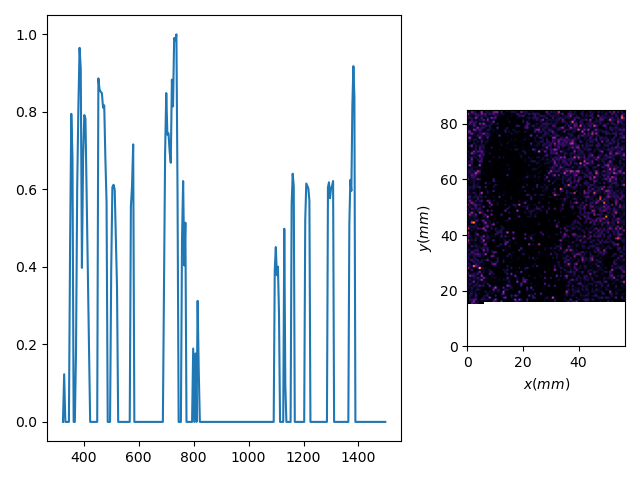

In [12]:
%matplotlib widget
fig,ax=subplots(1,2,width_ratios=[0.9,0.4])
ax[0].plot(wavelengths,edge_intensity)

axs = ax[1]
axs.imshow(mask_maps[100,:, :], cmap = cm.inferno, extent = [0, exp_properties['step_size']*exp_properties['n_points'][1],
                                                        0, exp_properties['step_size']*exp_properties['n_points'][0]])
axs.set_xlabel(r'$x(mm)$')
axs.set_ylabel(r'$y(mm)$')


def update_map(wn):
    im = ax[1].imshow(mask_maps[wn,:, :], cmap = cm.inferno,
                      extent = [0, exp_properties['step_size']*exp_properties['n_points'][1],
                            0, exp_properties['step_size']*exp_properties['n_points'][0]],
                     interpolation = 'none')
    #line.set_xdata(wavelengths_raman[offset_l:offset_m][wn])

def onclick(event):
    ix, iy = event.xdata, event.ydata
    wn = find_index(wavelengths_raman[offset_l:offset_m], ix)
    if event.inaxes == ax[0] or ax0:
        update_map(wn)
        fig.canvas.draw_idle()
        
cid = fig.canvas.mpl_connect('button_press_event', onclick)
fig.tight_layout()

In [28]:
#encontrar picos
peaks=scipy.signal.find_peaks(edge_intensity)[0]
heights=edge_intensity[peaks]
widths=scipy.signal.peak_widths(edge_intensity, peaks)[0]

signal_maps=[]

for i in range(peaks.shape[0]):
    if heights[i]>=0.2:
        signal_maps.append(mask_maps[peaks[i],:95,:])
signal_maps=np.array(signal_maps)


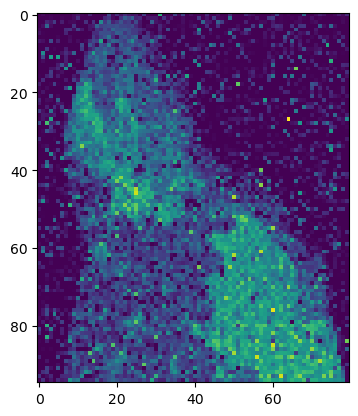

In [29]:
plt.figure()
plt.imshow(signal_maps[2,:,:])

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


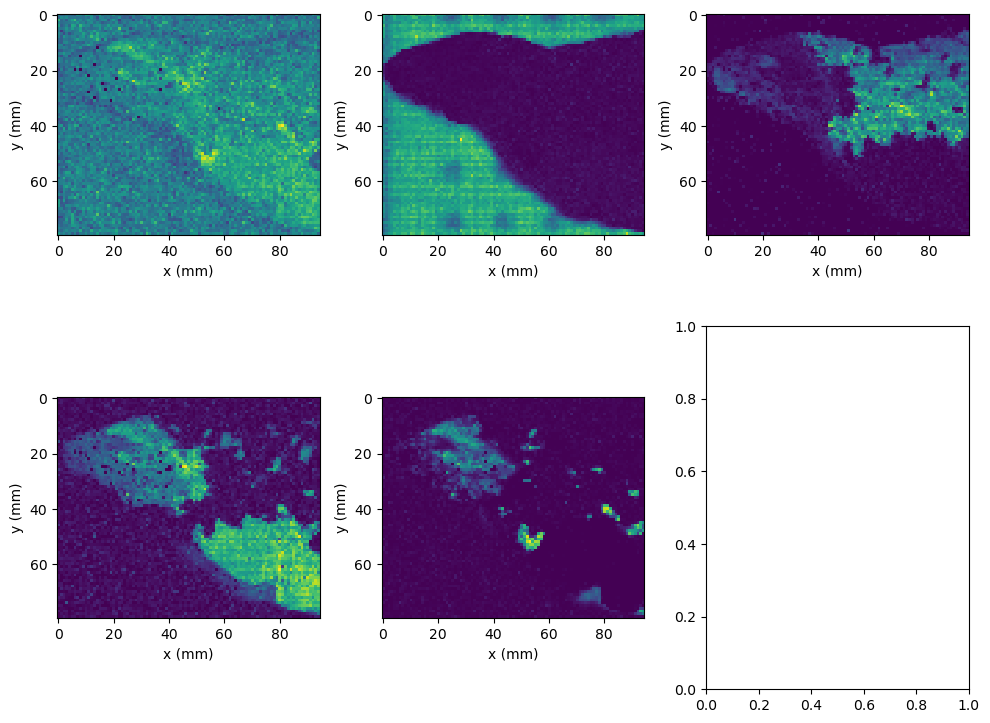

In [33]:
kmeans = sklearn.cluster.KMeans(n_clusters = 5,random_state=0)

features=signal_maps.reshape(-1,signal_maps.shape[1]*signal_maps.shape[2])
a=kmeans.fit_predict(features)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(signal_maps.shape[1], signal_maps.shape[2]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

In [54]:
minerals = {
    
    'Albite':[508.1],
    'Background':[733.1],
    #'Petalite':[491.3],
    'Quartz':[463.92],
    #'Spodumene':[704.5]
    'Muscovite':[263],
    'Lepidolite':[707] 
    
}

mineral_list = list(minerals.keys())

In [1]:
#comparação
fig,axs=plt.subplots(2,5)
for i in range(5):
    ax=axs[0,i]
    ax.imshow(clusters_c[i].reshape(signal_maps.shape[1], signal_maps.shape[2]).T, interpolation = 'none')

    ax=axs[1,i]
    ind=minerals[mineral_list[i]]
    ax.imshow(mask_maps[find_index(wavelengths,ind),:95,:].T)
    ax.set_title(mineral_list[i])
    

NameError: name 'plt' is not defined

In [50]:
muscovite=read_ref('C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/imaging_clustering/Muscovite')
lepidolite=read_ref('C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/imaging_clustering/Lepidolite')

In [45]:
muscovite

(array([ 165.9502,  167.8787,  169.8071, ..., 4360.365 , 4362.293 ,
        4364.222 ]),
 array([ 2.470854e+03,  2.413159e+03,  2.372408e+03, ...,  2.446361e+01,
        -2.175931e+00,  1.421642e+01]))

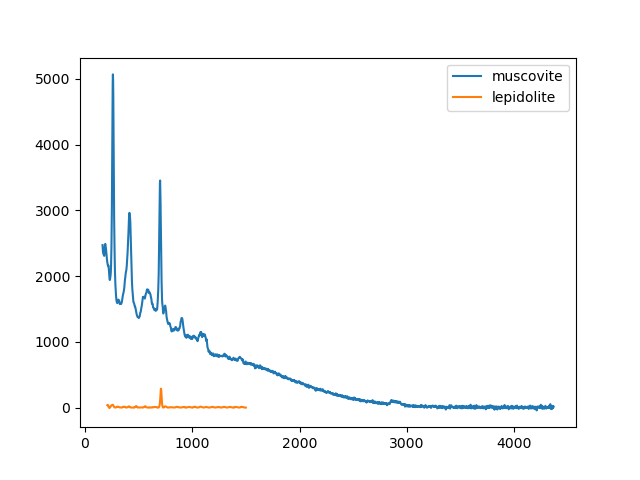

In [51]:
wavenum_muscovite=muscovite[0]
spec_muscovite=muscovite[1]
%matplotlib widget

fig,ax=subplots()
ax.plot(wavenum_muscovite,spec_muscovite,label='muscovite')
ax.plot(lepidolite[0],lepidolite[1],label='lepidolite')
ax.legend()

# 2.0 LIBS

In [7]:

def read_data_map(file):
    hf = h5py.File(file, 'r')
    spectrums = np.array(hf.get('intensities'))
    positions = np.array(hf.get('position'))
    wavelengths = np.array(hf.get('wavelengths'))
    positions = np.delete(positions, 0, 0)
    spectrums = np.delete(spectrums, 0, 0)
    x = positions[:, 0]
    y = positions[:, 1]
    xy = np.lexsort((y, x))

    hf.close()
    return spectrums[xy], wavelengths, positions
folder='C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/imaging_clustering/dados/'
filename = folder+"340.h5"
spectrum, wavelengths, positions = read_data_map(filename)
spectrum=spectrum.reshape(80, 80, -1)
wavelengths=wavelengths.flatten()

pro_data = 1*spectrum

pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec
mask = pro_data_norm[:, :, :].reshape(pro_data.shape[0]*pro_data.shape[1], -1)
       
threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in tqdm(range(mask_offset.shape[-1]))])

100%|██████████| 14336/14336 [00:06<00:00, 2061.05it/s]


In [8]:
mask_t_g=gaussian_filter(mask_t,sigma=0.2)


thresholds=np.array([threshold_otsu(mask_t_g[i]) for i in range(mask_t_g.shape[0])])
final_masks=[]
for map in range(len(thresholds)):
    c_mask=np.zeros(mask_t_g.shape[1])
    for i in range(mask_t_g.shape[1]):
        if mask_t_g[map,i]>thresholds[map]:
            c_mask[i]=1
    final_masks.append(c_mask)
    


In [21]:
final_masks=np.array(final_masks)
final_masks.shape

(14336, 6400)

In [22]:
#mask_maps=final_masks.reshape(-1,pro_data.shape[0],pro_data.shape[1])
maps=mask_t_g.reshape(-1,pro_data.shape[0],pro_data.shape[1])

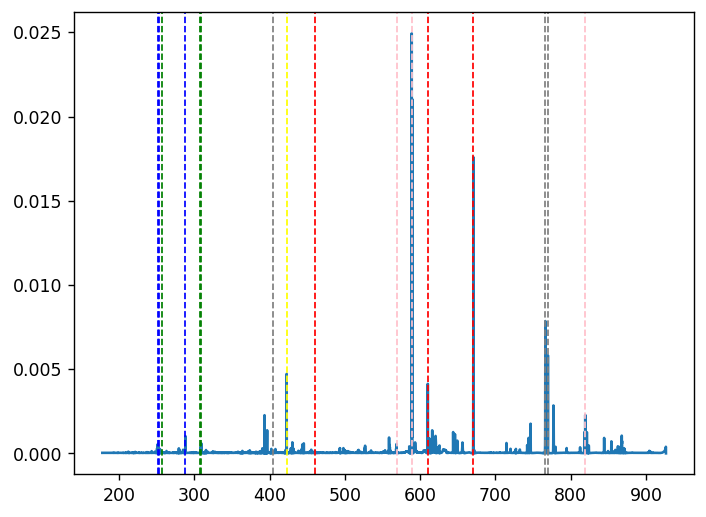

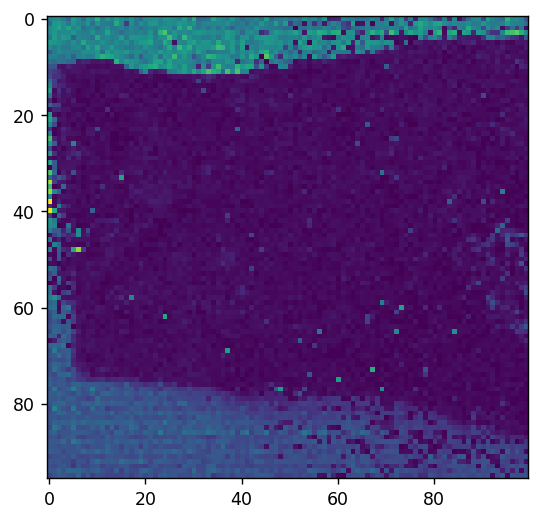

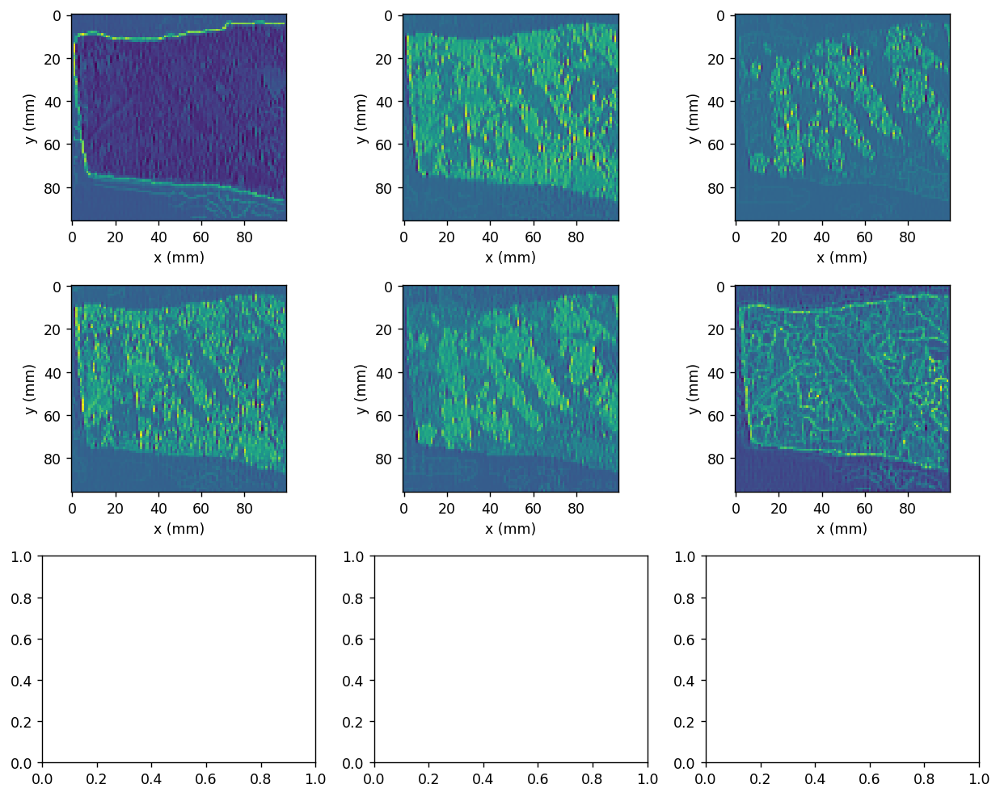

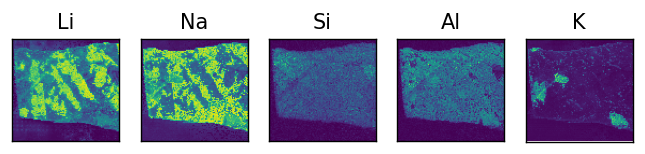

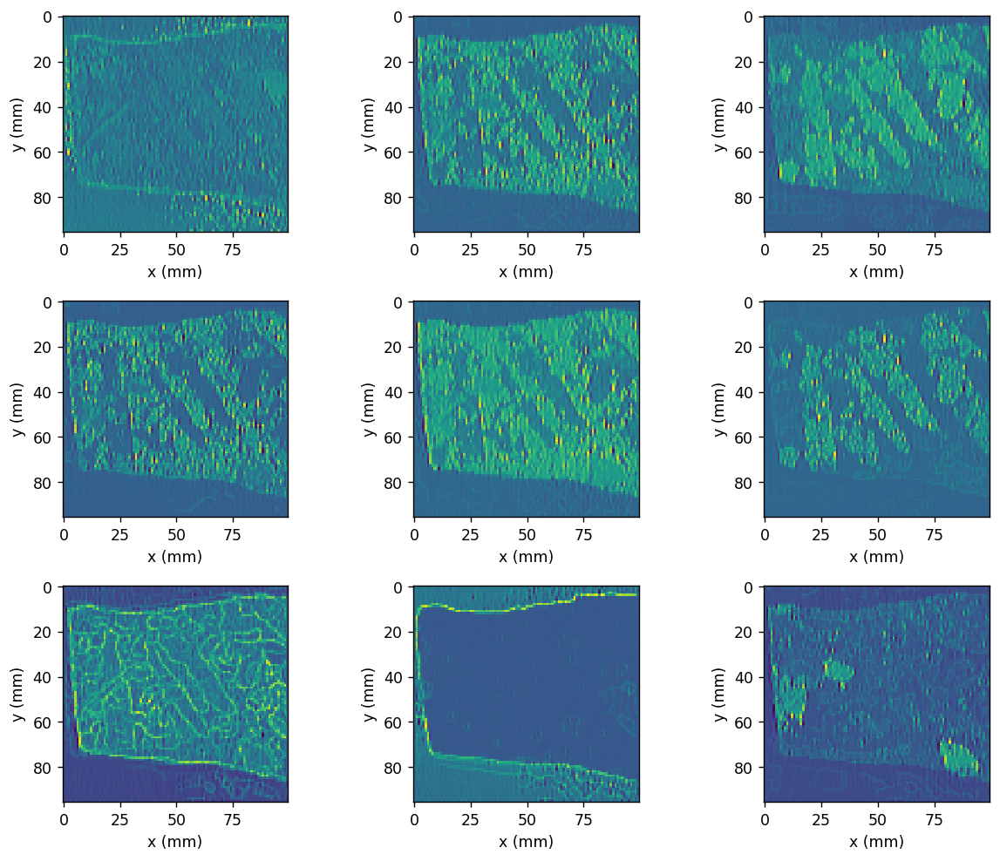

...

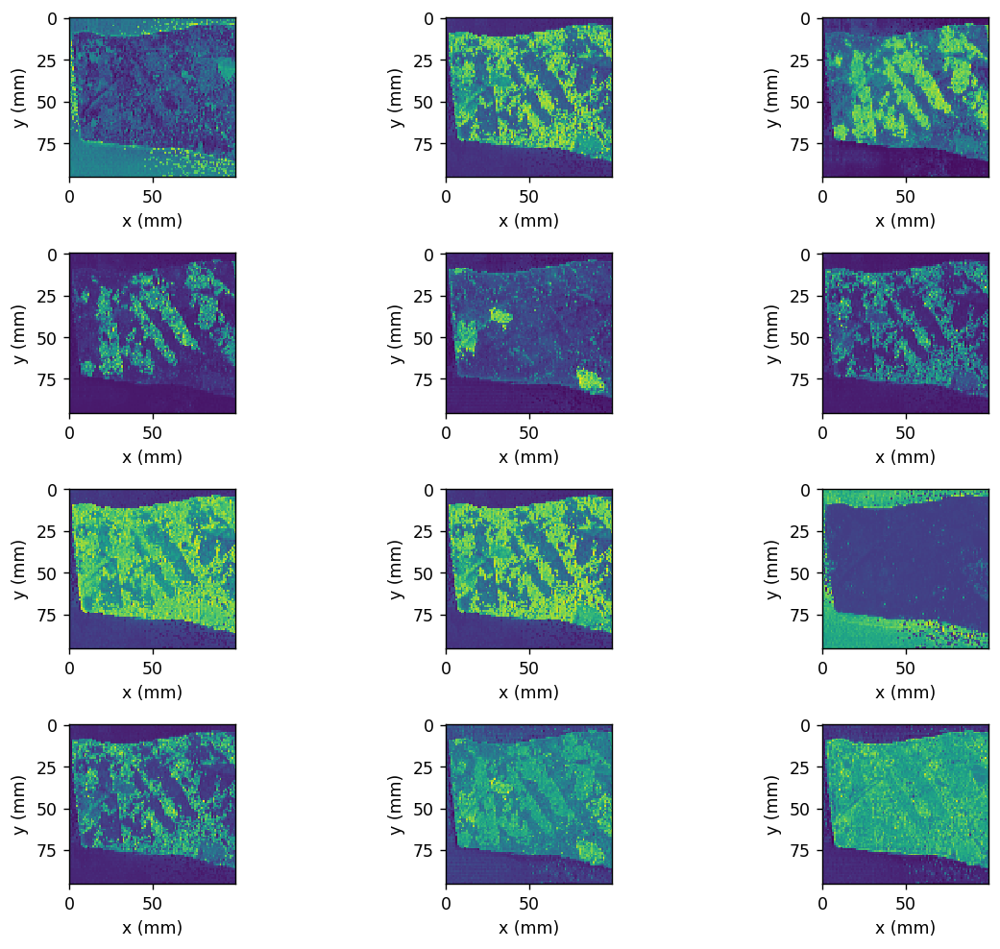

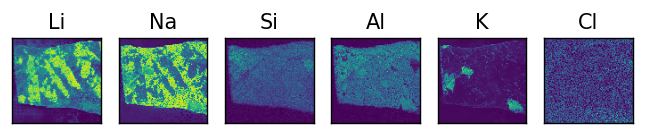

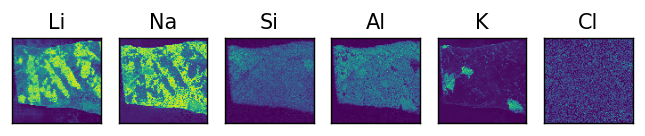

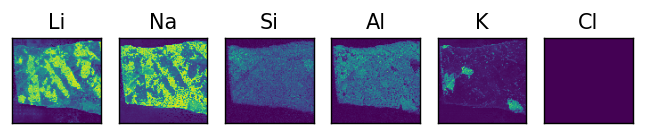

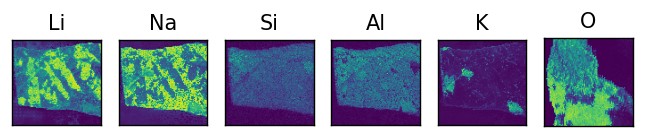

42


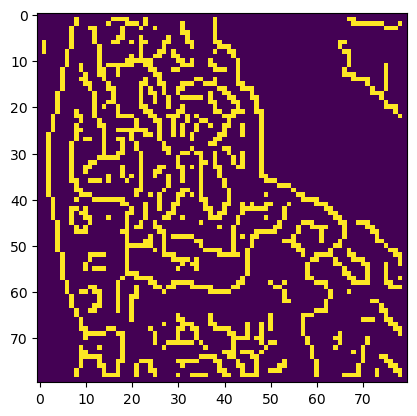

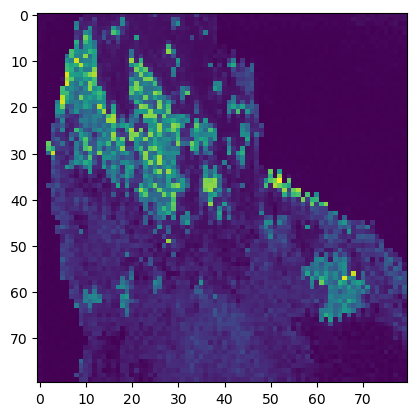

13


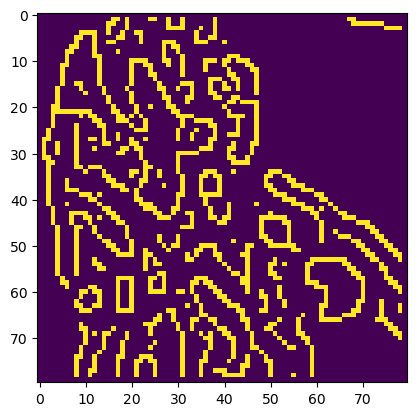

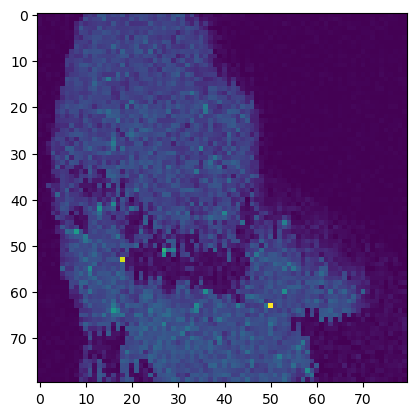

0


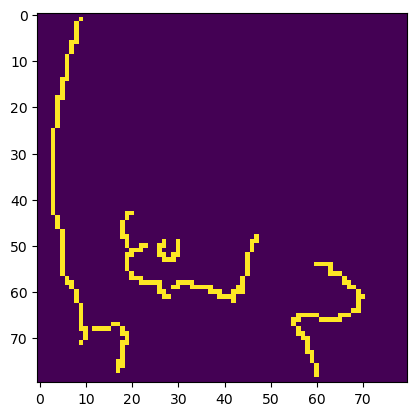

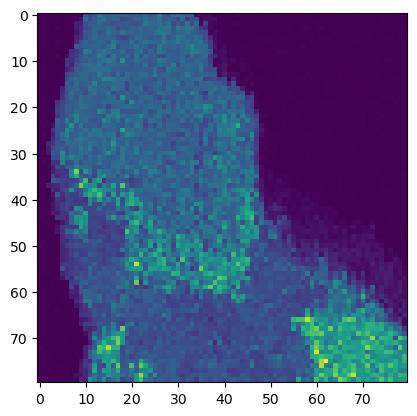

0


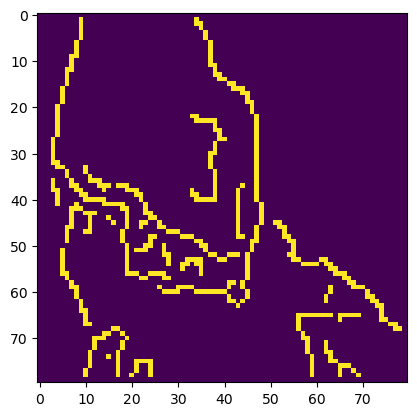

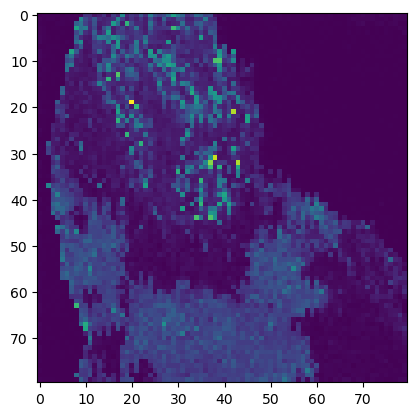

0


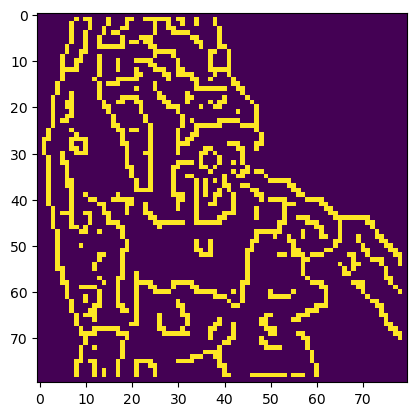

In [214]:
w=309.27
w=610
%matplotlib inline
#w=588
el=[670.76, 588.99, 309.27, 288.16, 766.5]
for i in range(len(el)):
    w=el[i]
    plt.imshow(maps[find_index(wavelengths,w)])
    plt.show()
    edges = feature.canny(maps[find_index(wavelengths,w)]*255,sigma=1.5)
    plt.imshow(edges)
    print(np.sum(edges[:20,60:]))
    plt.show()

In [215]:
for i in range(len(el)):
    edges=feature.canny(mask_maps[find_index(wavelengths,el[i])],sigma=1)
    print(np.sum(edges[:20,60:]))

NameError: name 'mask_maps' is not defined

In [33]:
edge_intensity=np.zeros(mask_maps.shape[0])
new_maps=[]
for w in tqdm(range(mask_maps.shape[0])):
    current_map=mask_maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=1)
    edge_sum=np.sum(edges[:20,60:])
    edge_intensity[w]=edge_sum
    if edge_sum <5:
        new_maps.append(maps[w,:,:])
new_maps=np.array(new_maps)
print(new_maps.shape)


100%|██████████| 14336/14336 [00:20<00:00, 707.94it/s]

(1745, 80, 80)


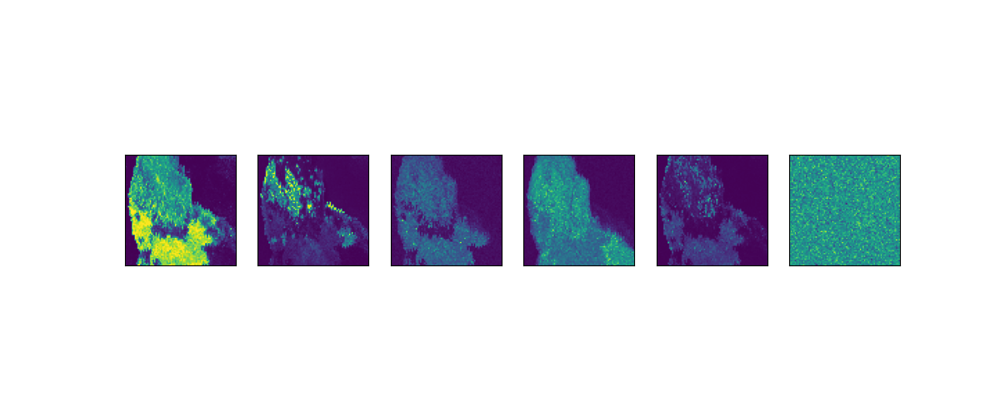

In [35]:
fig,ax=subplots(1,6,figsize=(12,5))
for i in range(len(el)):
    ax[i].imshow(pro_data[:,:,find_index(wavelengths,el[i])])
    ax[i].set_xticks([])
    ax[i].set_yticks([])

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


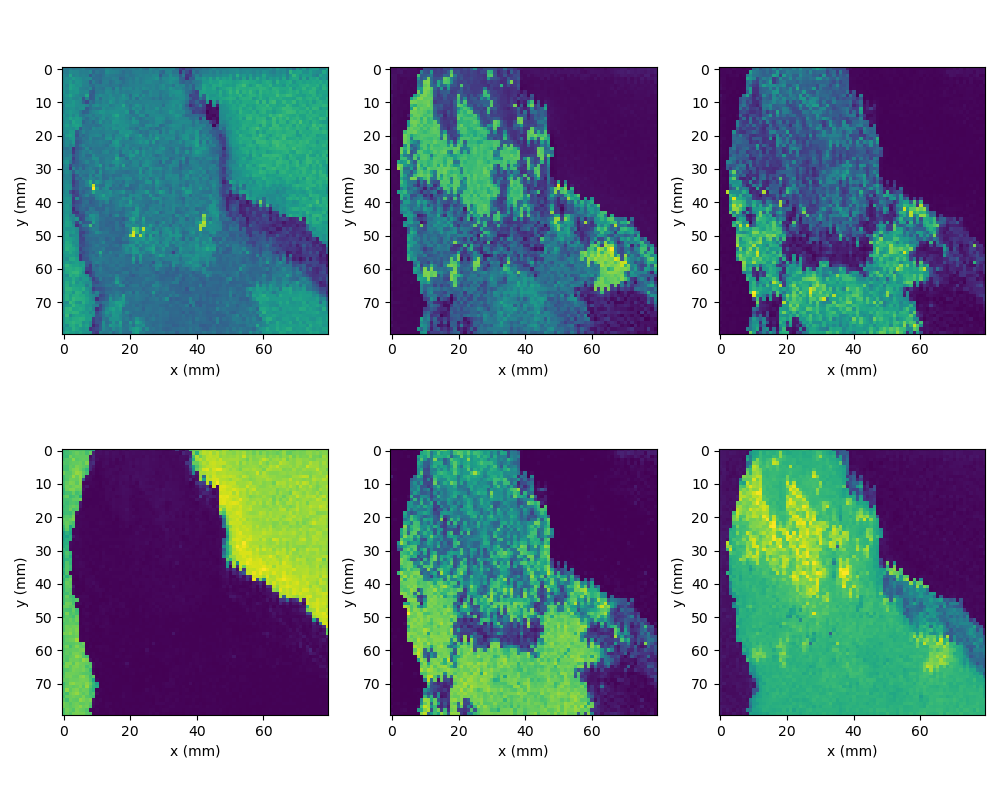

In [36]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=0)
 

features=new_maps.reshape(-1,new_maps.shape[1]*new_maps.shape[2])
a=kmeans.fit_predict(features)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

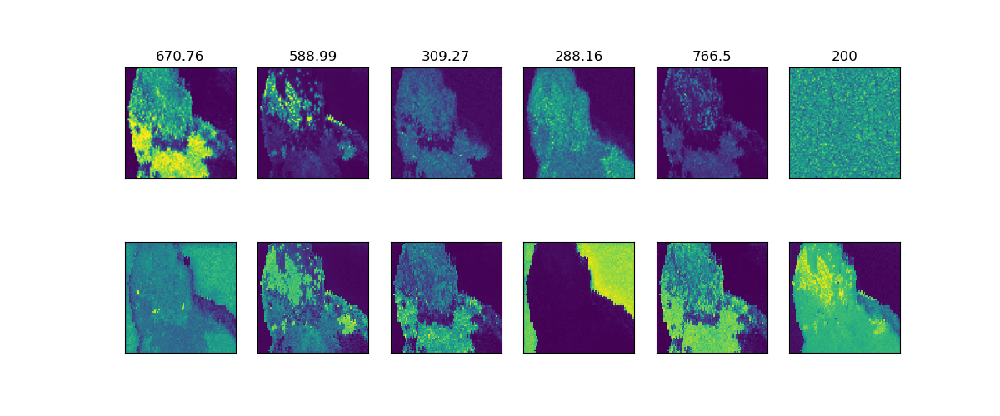

In [37]:
el=[670.76, 588.99, 309.27, 288.16, 766.5,200]
fig,ax=subplots(2,6,figsize=(12,5))
for i in range(len(el)):
    ax[0,i].imshow(pro_data[:,:,find_index(wavelengths,el[i])])
    ax[0,i].set_title(el[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])

    ax[1,i].imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])

# com várias features

## calculo dos edge maps

In [23]:
edge_maps=[]
for w in tqdm(range(maps.shape[0])):
    current_map=maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=1.5)
    edge_maps.append(edges)
edge_maps=np.array(edge_maps)

100%|██████████| 14336/14336 [00:14<00:00, 1017.77it/s]


In [25]:
texture_maps=[]

for w in tqdm(range(maps.shape[0])):
    current_map=maps[w,:,:]
    filt_real, filt_imag = gabor(current_map, frequency=0.6) #lower f, more sensitivty to detail
    texture_maps.append(filt_real)
texture_maps=np.array(texture_maps)

100%|██████████| 14336/14336 [00:14<00:00, 991.61it/s] 


In [27]:
#Al 237.23,308.17,309.25

#K,693.80,766.40,769.81
#Li,610.22,670.76,812.56
#Na,568.77,588.95,819.40

#Si 288.16,251.59,252.82

#Rb 779.94,794.58
el_n=['Li','Na','Al','Si','K','Rb']
el=[670.76, 588.99, 309.27, 252.82,769.81,779.94]

In [31]:
new_features=maps*500+edge_maps*0.2+texture_maps*700 #pode precisar de ajustes nestes parametros
n_clusters=6
kmeans = sklearn.cluster.KMeans(n_clusters = n_clusters,random_state=0)
 

features=new_features.reshape(-1,texture_maps.shape[1]*texture_maps.shape[2])
a=kmeans.fit_predict(features)
labels = kmeans.labels_
clusters_c = np.array(kmeans.cluster_centers_)


c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


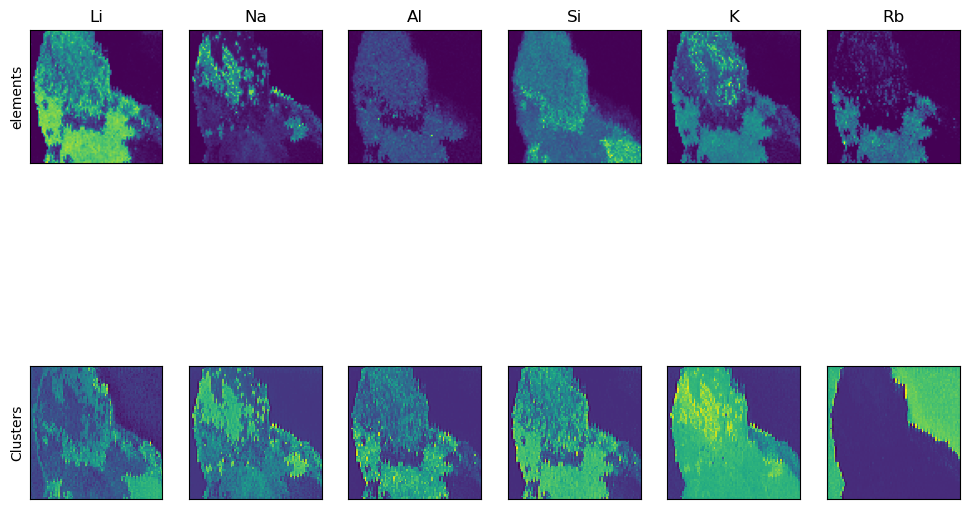

In [32]:
%matplotlib inline
fig,ax=subplots(2,n_clusters,figsize=(12,8))
for i in range(n_clusters):
    if i<len(el):
        wav=find_index(wavelengths,el[i])
        ax[0,i].imshow(maps[wav,:,:])
        ax[0,i].set_title(el_n[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('elements')
    ax[1,0].set_ylabel('Clusters')

    ax[1,i].imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')

## feature extraction com fft

In [33]:
normalized_spec1=np.transpose(mask_t_g.reshape(-1,80,80),axes=(1,2,0))

nx, ny = normalized_spec1.shape[1], normalized_spec1.shape[0]
dx = 0.5
dy = 0.5
 
freqs_x = 2*np.pi*np.fft.fftfreq(nx, dx)
freqs_y = 2*np.pi*np.fft.fftfreq(ny, dy)
 
def fft_feature(mmap, pixel_size_small):
    fft_map = np.array([np.fft.fftshift(np.fft.fft2(mmap[:, :, i])) for i in tqdm(range(0, (mmap.shape[-1])))])
    fft_map[:, fft_map.shape[1]//2, fft_map.shape[2]//2] = 0
 
    kxx, kyy = np.meshgrid(np.fft.fftshift(freqs_x), np.fft.fftshift(freqs_y))
 
    object_size_small = pixel_size_small*dx
    size_kspace_small = 2*np.pi/object_size_small/2*1.5
 
    R = abs(np.sqrt(kxx**2 + kyy**2))
 
    sum1 = np.sum(np.abs(fft_map[:,(R < size_kspace_small)]), axis = (1))
    max1 = np.sum(np.abs(fft_map), axis = (1, 2))
 
    sums = np.array(sum1)/np.array(max1)
 
    return sums, fft_map
 
sums, fft_m = fft_feature(normalized_spec1, 10)

100%|██████████| 14336/14336 [00:03<00:00, 3803.84it/s]


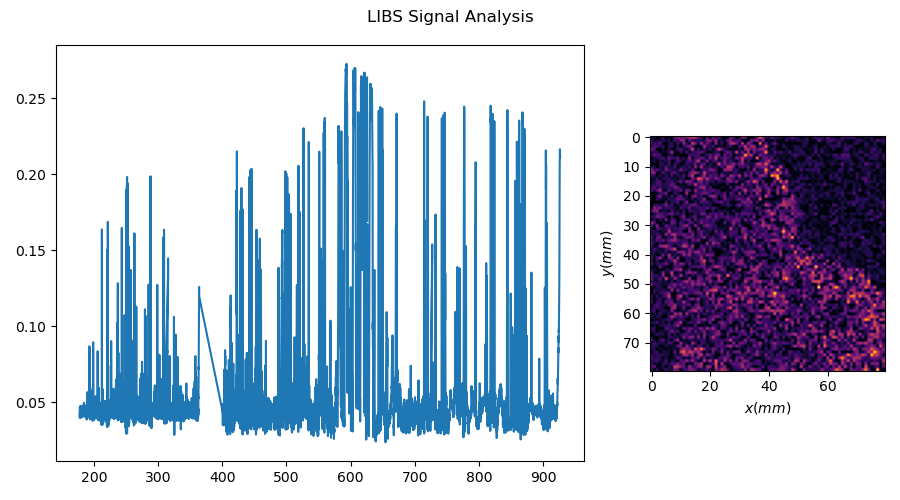

In [34]:
%matplotlib widget

wavelengths=wavelengths.flatten()
find_index = lambda wavelenghts,w : np.argmin(np.abs(wavelengths-w))
    
%matplotlib widget
fig, ax = subplots(1,2, figsize = (9, 5), gridspec_kw = {'width_ratios': [0.9, 0.4]})
fig.suptitle('LIBS Signal Analysis')

axs = ax[0]
axs.plot(wavelengths,sums)
axs = ax[1]
axs.imshow(normalized_spec1[:, :, 100], cmap = cm.inferno)
axs.set_xlabel(r'$x(mm)$')
axs.set_ylabel(r'$y(mm)$')


def update_map(wn):
    im = ax[1].imshow(normalized_spec1[:, :, wn], cmap = cm.inferno,
                     interpolation = 'none')

def onclick(event):
    ix, iy = event.xdata, event.ydata
    wn = find_index(wavelengths, ix)
    if event.inaxes == ax[0] or ax0:
        update_map(wn)
        fig.canvas.draw_idle()
        
cid = fig.canvas.mpl_connect('button_press_event', onclick)
fig.tight_layout()

In [86]:
peaks=scipy.signal.find_peaks(sums)[0]
sel_maps=[]
sel_wavs=[]
heights=sums[peaks]
for i in range(len(peaks)):
    if heights[i]>0.09:
        sel_maps.append(mask_t[peaks[i]])
        sel_wavs.append([wavelengths[peaks[i]]])

sel_maps=np.array(sel_maps)
sel_maps=sel_maps.reshape(-1,80,80)

In [87]:
edge_maps=[]
for w in tqdm(range(sel_maps.shape[0])):
    current_map=sel_maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=1)
    edge_maps.append(edges)
edge_maps=np.array(edge_maps)
texture_maps=[]

for w in tqdm(range(sel_maps.shape[0])):
    current_map=sel_maps[w,:,:]
    filt_real, filt_imag = gabor(current_map, frequency=0.5) #lower f, more sensitivty to detail
    texture_maps.append(filt_real)
texture_maps=np.array(texture_maps)

100%|██████████| 278/278 [00:00<00:00, 1068.78it/s]


In [186]:
n_clusters=7
kmeans = sklearn.cluster.KMeans(n_clusters = n_clusters,random_state=0)

#new_features=sel_maps*500+edge_maps*0.4+texture_maps*800 #melhor resultado
 
new_features=sel_maps*500+edge_maps*0.4+texture_maps*800 #pode precisar de ajustes nestes parametros
features=new_features.reshape(-1,80*80)
a=kmeans.fit_predict(features)
labels = kmeans.labels_
clusters_c = np.array(kmeans.cluster_centers_)

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


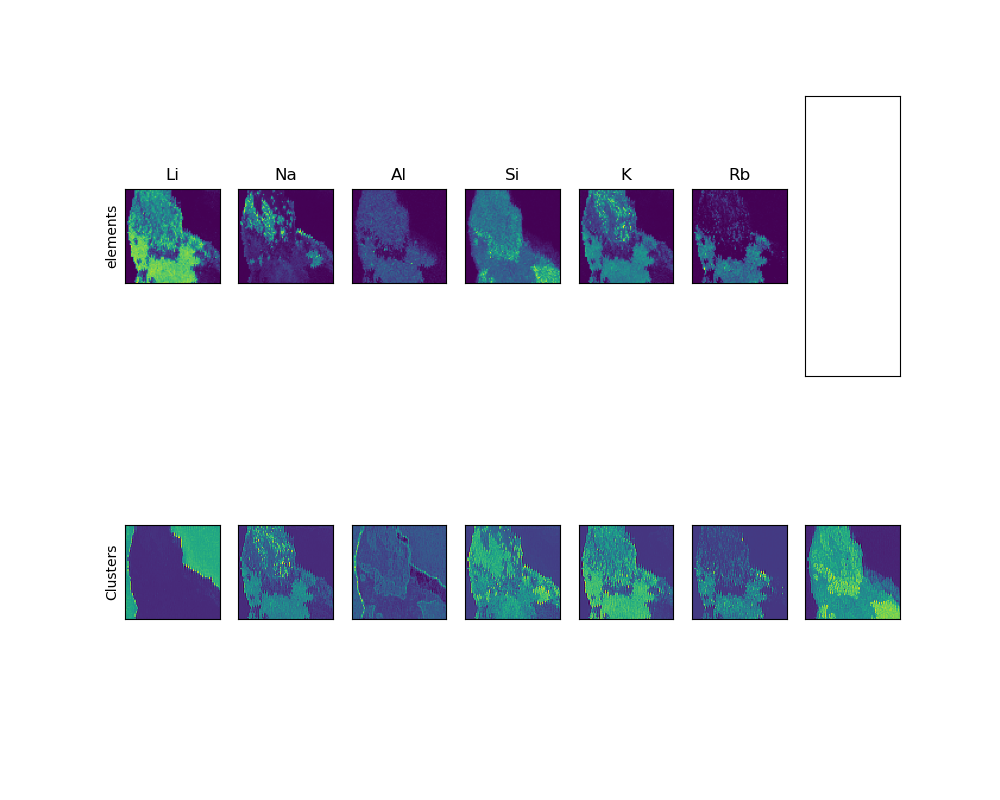

In [187]:
fig,ax=subplots(2,n_clusters,figsize=(10,8))
for i in range(n_clusters):
    if i<len(el):
        wav=find_index(wavelengths,el[i])
        ax[0,i].imshow(maps[wav,:,:])
        ax[0,i].set_title(el_n[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('elements')
    ax[1,0].set_ylabel('Clusters')

    ax[1,i].imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')

## c/ normalização

In [155]:
sel_maps_norm=np.zeros(sel_maps.shape)
#min max scaling
'''for i in range(sel_maps.shape[0]):
    maxi=np.max(sel_maps[i])
    mini=np.min(sel_maps[i])

    sel_maps_norm[i]=(sel_maps[i]-mini)/(maxi-mini + 1e-7)'''

#histogram equalization
from skimage import exposure
# Equalization
#for i in range(sel_maps.shape[0]):
 #   sel_maps_norm[i] = exposure.equalize_hist(sel_maps[i])

#for i in range(sel_maps.shape[0]):
 #   sel_maps_norm[i]=sel_maps[i]/np.max(sel_maps[i])

#contrast stretching
for i in range(sel_maps.shape[0]):
    p2, p98 = np.percentile(sel_maps[i], (2, 98))
    sel_maps_norm[i] = exposure.rescale_intensity(sel_maps[i], in_range=(p2, p98))


In [156]:
edge_maps=[]
for w in tqdm(range(sel_maps.shape[0])):
    current_map=sel_maps_norm[w,:,:]*255
    edges = feature.canny(current_map,sigma=1)
    edge_maps.append(edges)
edge_maps=np.array(edge_maps)
texture_maps=[]

for w in tqdm(range(sel_maps.shape[0])):
    current_map=sel_maps_norm[w,:,:]
    filt_real, filt_imag = gabor(current_map, frequency=0.5) #lower f, more sensitivty to detail
    texture_maps.append(filt_real)
texture_maps=np.array(texture_maps)

100%|██████████| 337/337 [00:00<00:00, 1250.59it/s]


In [157]:
np.mean(texture_maps)

0.0013060730740573785

In [158]:
np.mean(sel_maps_norm)

0.33134955925848925

In [159]:
np.mean(edge_maps)

0.30313334569732936

In [196]:
n_clusters=7
kmeans = sklearn.cluster.KMeans(n_clusters = n_clusters,random_state=0)
 
new_features=sel_maps*300+edge_maps*0.2+texture_maps*3 
features=new_features.reshape(-1,80*80)
a=kmeans.fit_predict(features)
labels = kmeans.labels_
clusters_c = np.array(kmeans.cluster_centers_)

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


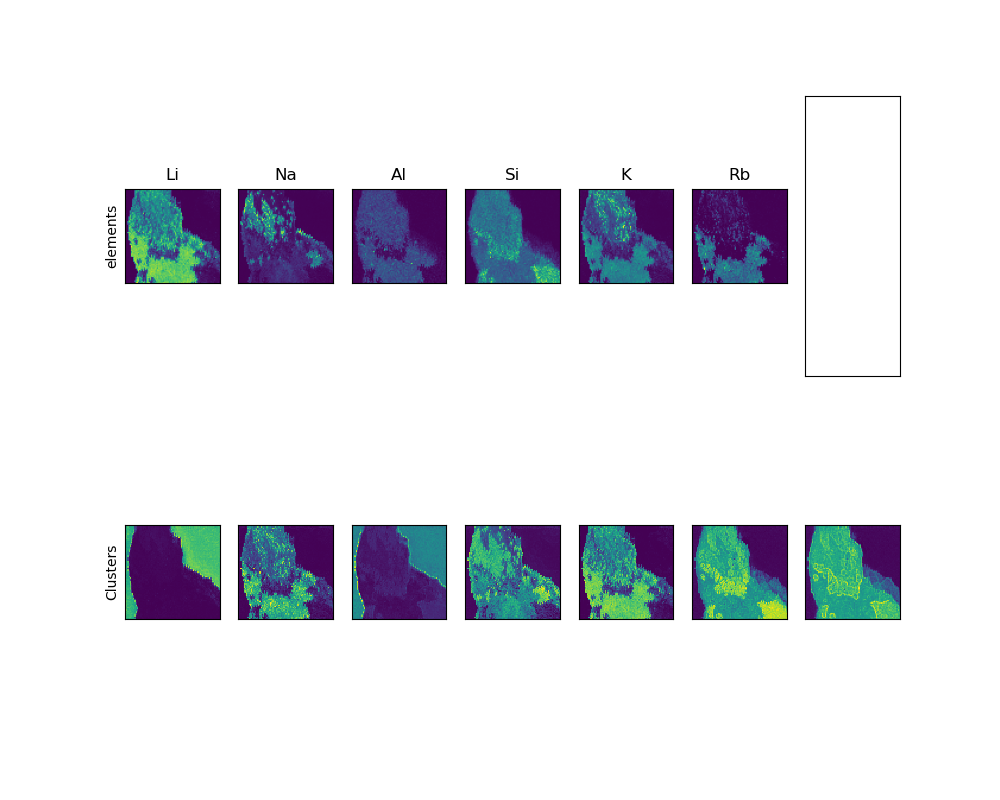

In [197]:
fig,ax=subplots(2,n_clusters,figsize=(10,8))
for i in range(n_clusters):
    if i<len(el):
        wav=find_index(wavelengths,el[i])
        ax[0,i].imshow(maps[wav,:,:])
        ax[0,i].set_title(el_n[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('elements')
    ax[1,0].set_ylabel('Clusters')

    ax[1,i].imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')

## com os dados hdr

In [7]:
file='C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/Mini-bife_3_energias/hdr_minibife.h5'
def read_data_map_2(file):
    # Open the HDF5 file in read mode
    with h5py.File(file, 'r') as hf:
        # Extract the datasets and convert them to numpy arrays
        spectrums = np.array(hf.get('intensities'))
        positions = np.array(hf.get('position'))
        wavelengths = np.array(hf.get('wavelengths'))

    # Return the data as is
    return spectrums, wavelengths, positions
spectrum, wavelengths, positions = read_data_map_2(file)
#spectrum=spectrum.reshape(80, 80, -1)

In [8]:
el_n=['Li','Na','Al','Si','K','Rb']
el=[670.76, 588.99, 309.27, 252.82,769.81,779.94]

In [9]:
maps=spectrum.copy()

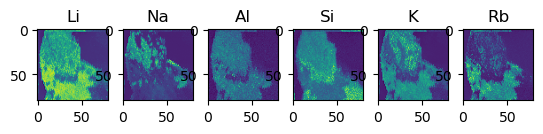

In [10]:
fig,ax=subplots(1,len(el))
for i in range(len(el)):
    ax[i].imshow(maps[find_index(wavelengths,el[i]),:,:])
    ax[i].set_title(el_n[i])

In [11]:
normalized_spec1=np.transpose(maps.reshape(-1,80,80),axes=(1,2,0))

nx, ny = normalized_spec1.shape[1], normalized_spec1.shape[0]
dx = 0.5
dy = 0.5
 
freqs_x = 2*np.pi*np.fft.fftfreq(nx, dx)
freqs_y = 2*np.pi*np.fft.fftfreq(ny, dy)
 
def fft_feature(mmap, pixel_size_small):
    fft_map = np.array([np.fft.fftshift(np.fft.fft2(mmap[:, :, i])) for i in tqdm(range(0, (mmap.shape[-1])))])
    fft_map[:, fft_map.shape[1]//2, fft_map.shape[2]//2] = 0
 
    kxx, kyy = np.meshgrid(np.fft.fftshift(freqs_x), np.fft.fftshift(freqs_y))
 
    object_size_small = pixel_size_small*dx
    size_kspace_small = 2*np.pi/object_size_small/2*1.5
 
    R = abs(np.sqrt(kxx**2 + kyy**2))
 
    sum1 = np.sum(np.abs(fft_map[:,(R < size_kspace_small)]), axis = (1))
    max1 = np.sum(np.abs(fft_map), axis = (1, 2))
 
    sums = np.array(sum1)/np.array(max1)
 
    return sums, fft_map
 
sums, fft_m = fft_feature(normalized_spec1, 10)

100%|██████████| 14336/14336 [00:03<00:00, 4088.44it/s]


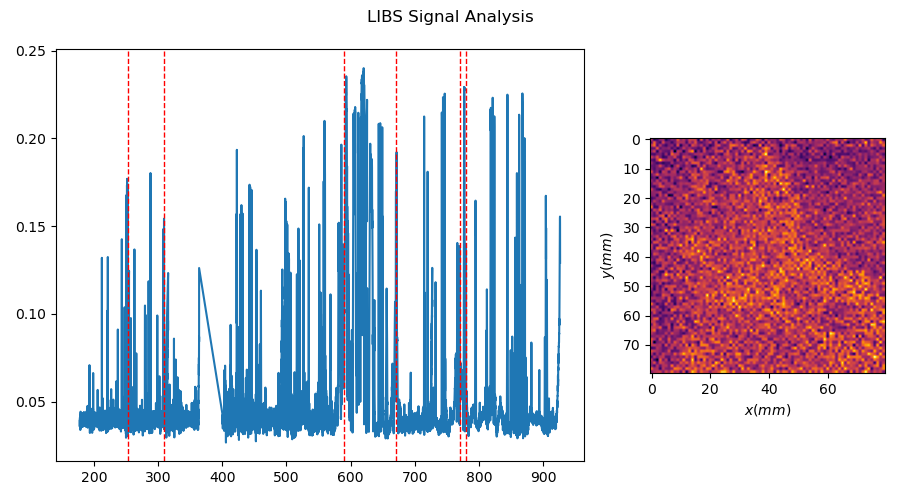

In [12]:

find_index = lambda wavelenghts,w : np.argmin(np.abs(wavelengths-w))
    
%matplotlib widget
fig, ax = subplots(1,2, figsize = (9, 5), gridspec_kw = {'width_ratios': [0.9, 0.4]})
fig.suptitle('LIBS Signal Analysis')

axs = ax[0]
axs.plot(wavelengths,sums)
for i in range(len(el)):
    axs.axvline(el[i],linestyle='--',color='red',lw=1)
axs = ax[1]
axs.imshow(maps[100,:, :], cmap = cm.inferno)
axs.set_xlabel(r'$x(mm)$')
axs.set_ylabel(r'$y(mm)$')



def update_map(wn):
    im = ax[1].imshow(maps[wn,:, :],
                     interpolation = 'none')

def onclick(event):
    ix, iy = event.xdata, event.ydata
    wn = find_index(wavelengths, ix)
    if event.inaxes == ax[0] or ax0:
        update_map(wn)
        fig.canvas.draw_idle()
        
cid = fig.canvas.mpl_connect('button_press_event', onclick)
fig.tight_layout()

In [13]:
peaks=scipy.signal.find_peaks(sums)[0]
sel_maps=[]
sel_wavs=[]
heights=sums[peaks]
for i in range(len(peaks)):
    if heights[i]>0.13:
        sel_maps.append(maps[peaks[i]])
        sel_wavs.append([wavelengths[peaks[i]]])

sel_maps=np.array(sel_maps)
sel_maps=sel_maps.reshape(-1,80,80)

In [14]:
# para os mapas que estão dentro dos parametros da fft retirar os que tem sinal fora da rocha
sel_maps_f=sel_maps.reshape(-1,sel_maps.shape[1]*sel_maps.shape[2])
thresholds=np.array([threshold_otsu(sel_maps_f[i]) for i in range(sel_maps.shape[0])])
final_masks=[]
for map in range(len(thresholds)):
    c_mask=np.zeros(sel_maps_f.shape[1])
    for i in range(sel_maps_f.shape[1]):
        if sel_maps_f[map,i]>thresholds[map]:
            c_mask[i]=1
    final_masks.append(c_mask)

final_masks=np.array(final_masks).reshape(-1,sel_maps.shape[1],sel_maps.shape[2])


new_maps=[]
edge=[]
for w in tqdm(range(sel_maps.shape[0])):
    current_map=final_masks[w,:,:]
    pixel_sum=np.sum(current_map[10:30,60:])
    if pixel_sum <1:
        new_maps.append(sel_maps[w,:,:])
new_maps=np.array(new_maps)
print(sel_maps.shape)
print(new_maps.shape)

100%|██████████| 179/179 [00:00<00:00, 15692.59it/s]

(179, 80, 80)
(45, 80, 80)


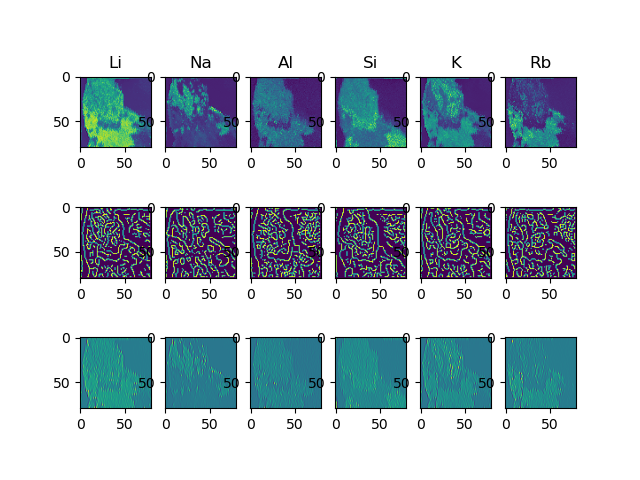

In [15]:
fig,ax=subplots(3,len(el))
for i in range(len(el)):
    c_map=maps[find_index(wavelengths,el[i]),:,:]
    ax[0,i].imshow(c_map)
    ax[0,i].set_title(el_n[i])
    ax[1,i].imshow(feature.canny(c_map*255,sigma=1.5))
    ax[2,i].imshow(gabor(c_map*255, frequency=0.6)[0])

In [16]:
edge_maps=[]
for w in tqdm(range(new_maps.shape[0])):
    current_map=new_maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=1.5)
    edge_maps.append(edges)
edge_maps=np.array(edge_maps)
texture_maps=[]

for w in tqdm(range(new_maps.shape[0])):
    current_map=new_maps[w,:,:]
    filt_real, filt_imag = gabor(current_map, frequency=0.6) #lower f, more sensitivty to detail
    texture_maps.append(filt_real)
texture_maps=np.array(texture_maps)

100%|██████████| 45/45 [00:00<00:00, 1387.28it/s]


In [17]:
print(np.mean(edge_maps))
print(np.mean(sel_maps))
print(np.mean(texture_maps))

0.20706597222222223
0.27039720370142273
0.020525888600162686


In [18]:
n_clusters=8
kmeans = sklearn.cluster.KMeans(n_clusters = n_clusters,random_state=0)
 
new_features=new_maps*500#+edge_maps*10+texture_maps*1000
features=new_features.reshape(-1,80*80)
a=kmeans.fit_predict(features)
labels = kmeans.labels_
clusters_c = np.array(kmeans.cluster_centers_)

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [19]:
el

[670.76, 588.99, 309.27, 252.82, 769.81, 779.94]

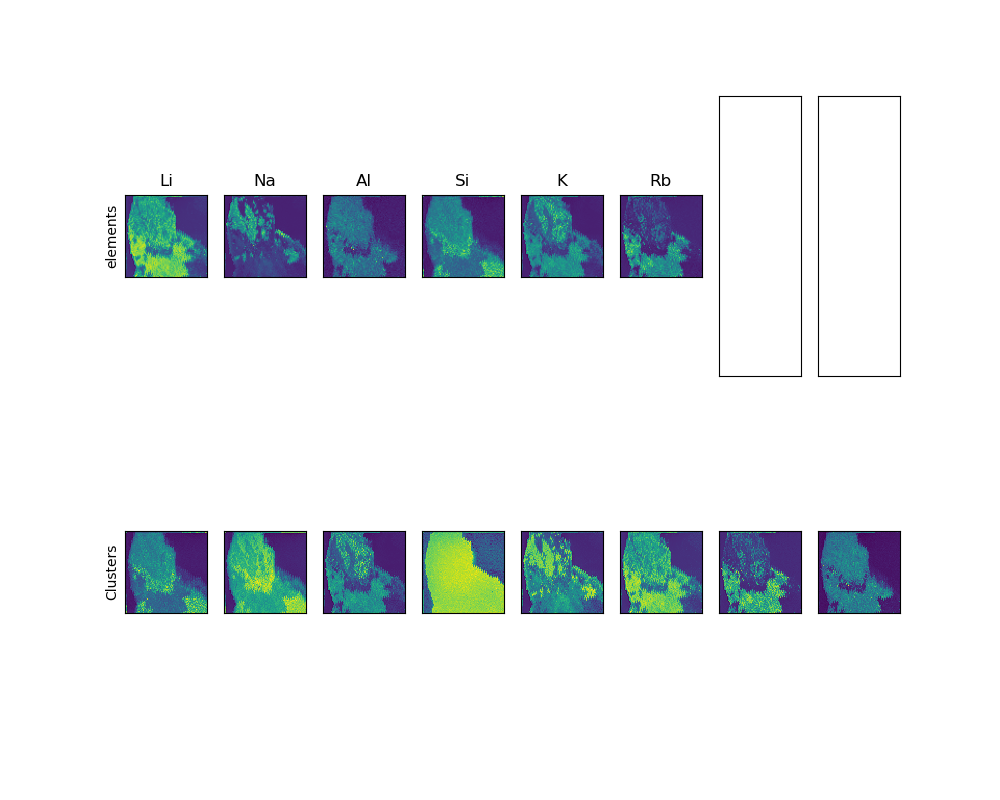

In [20]:
fig,ax=subplots(2,n_clusters,figsize=(10,8))
for i in range(n_clusters):
    if i<len(el):
        wav=find_index(wavelengths,el[i])
        ax[0,i].imshow(maps[wav,:,:])
        ax[0,i].set_title(el_n[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('elements')
    ax[1,0].set_ylabel('Clusters')

    ax[1,i].imshow(clusters_c[i].reshape(maps.shape[1], maps.shape[2]), interpolation = 'none')
    savefig('clustering_results_minibife.jpg',dpi=400)

In [21]:
clusters_c.shape

(8, 6400)

In [22]:
cluster_label=['Si','O','K','Sample','Na','Li','Rb','Al']
#indices que nao vale a pena calcular interseções
#[0] e [1] porque estão presentes em toda a amostra -> todos os minerais têm Si e Oxigénio
#[3] porque é só o contorno da amostra

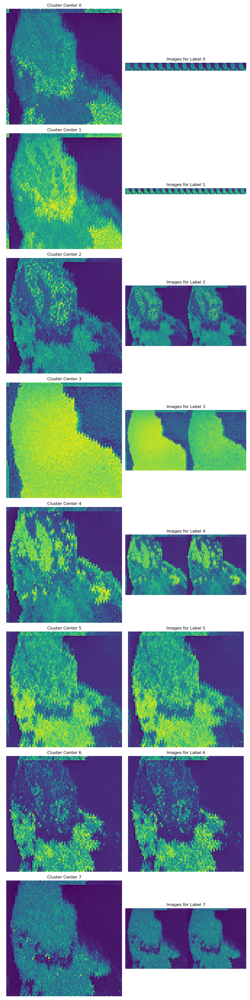

In [23]:
# verificar mapas classificados em cada cluster
import numpy as np
import matplotlib.pyplot as plt

# Assuming the following variables are defined:
# - labels: your labels array from k-means
# - clusters_c: your cluster centers array
# - features: the array of features/images used in k-means clustering
# - maps: used to determine the reshaping dimensions
%matplotlib widget
# Reshape dimensions
height, width = maps.shape[1], maps.shape[2]

# Find unique labels
unique_labels = np.unique(labels)

# Create subplots with enough space to visualize
fig, ax = plt.subplots(len(unique_labels), 2, figsize=(10, 5 * len(unique_labels)))

for i, label in enumerate(unique_labels):
    # Display the cluster center
    ax[i, 0].imshow(clusters_c[label].reshape(height, width), interpolation='none')
    ax[i, 0].set_title(f'Cluster Center {label}')
    ax[i, 0].axis('off')

    # Collect and display all images corresponding to this label
    label_indices = np.where(labels == label)[0]
    all_features = [features[idx].reshape(height, width) for idx in label_indices]
    
    # Display images
    combined_image = np.concatenate(all_features, axis=1)  # Combine images side by side
    ax[i, 1].imshow(combined_image, interpolation='none')
    ax[i, 1].set_title(f'Images for Label {label}')
    ax[i, 1].axis('off')

plt.tight_layout()
plt.show()



In [24]:
# nao parece haver misturas de cluster

In [25]:
#thresholds
clusters_reshaped=clusters_c.reshape(-1,maps.shape[1], maps.shape[2])

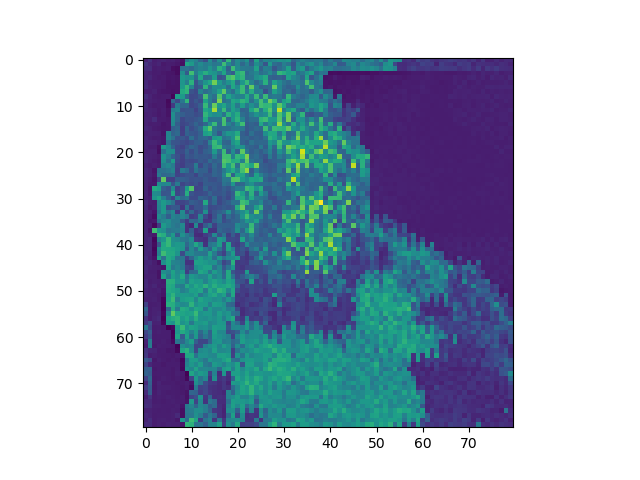

In [26]:
plt.figure()
plt.imshow(clusters_reshaped[2])
#limites x todo
#limites y 10:50

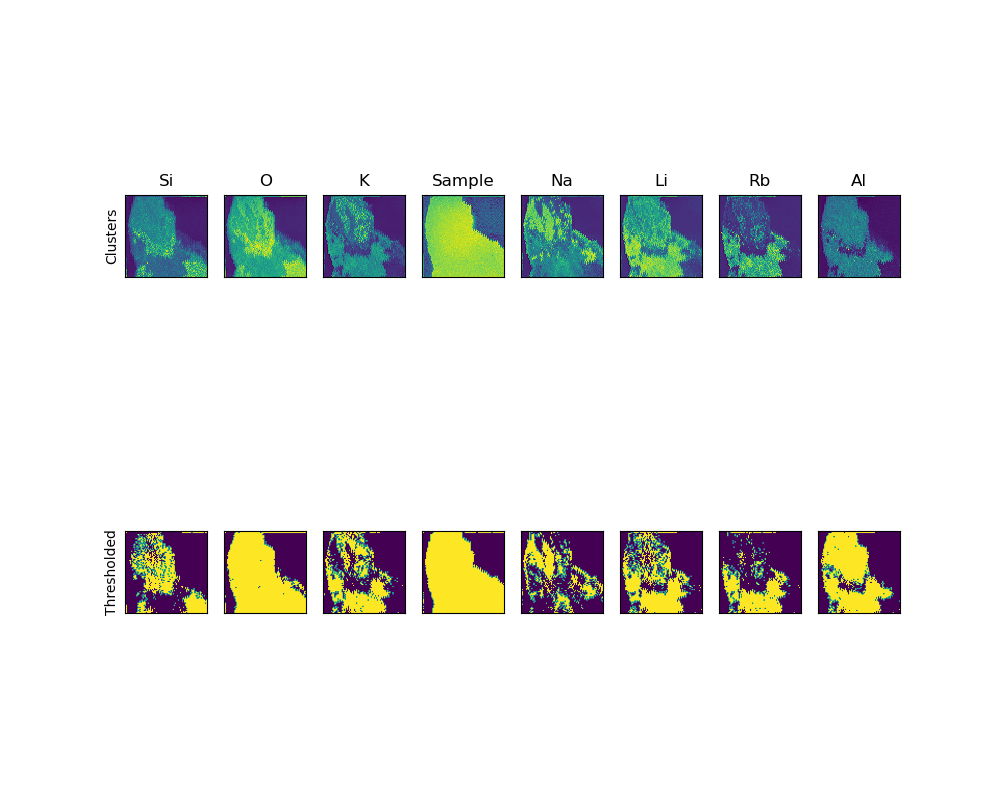

In [27]:
fig,ax=subplots(2,n_clusters,figsize=(10,8))
thresholded_clusters=[]

for i in range(n_clusters):
    ax[0,i].imshow(clusters_reshaped[i], interpolation = 'none')
    ax[0,i].set_title(cluster_label[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('Clusters')


    t=threshold_otsu(clusters_reshaped[i,:,10:50])# a threshold tem de ser definida só dentro da amostra
    cluster_t=clusters_reshaped[i].copy()>t
    thresholded_clusters.append(cluster_t)
    ax[1,i].imshow(cluster_t)


    ax[1,0].set_ylabel('Thresholded')
thresholded_clusters=np.array(thresholded_clusters)

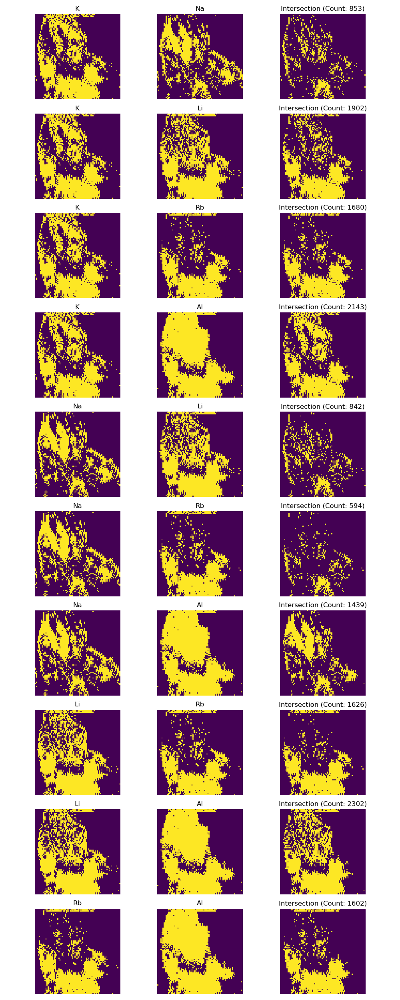

In [28]:
#interseções 2 a 2
excluded_indices = {0, 1, 3}
valid_indices = [i for i in range(len(thresholded_clusters)) if i not in excluded_indices]

intersections = {}
fig, axes = plt.subplots(len(valid_indices) * (len(valid_indices) - 1) // 2, 3, figsize=(10, 5 * len(valid_indices)))

plot_index = 0
for i in valid_indices:
    for j in valid_indices:
        if i < j:  
            intersection = np.logical_and(thresholded_clusters[i], thresholded_clusters[j])
            intersection_count = np.sum(intersection)  


            intersections[(i, j)] = intersection_count

            ax1, ax2, ax3 = axes[plot_index]
            ax1.imshow(thresholded_clusters[i],interpolation='none')
            ax1.set_title(f'{cluster_label[i]}') 
            ax1.axis('off')

            ax2.imshow(thresholded_clusters[j], interpolation='none')
            ax2.set_title(f'{cluster_label[j]}')  
            ax2.axis('off')

            ax3.imshow(intersection,interpolation='none')
            ax3.set_title(f'Intersection (Count: {intersection_count})')
            ax3.axis('off')

            plot_index += 1

plt.tight_layout()
plt.show()

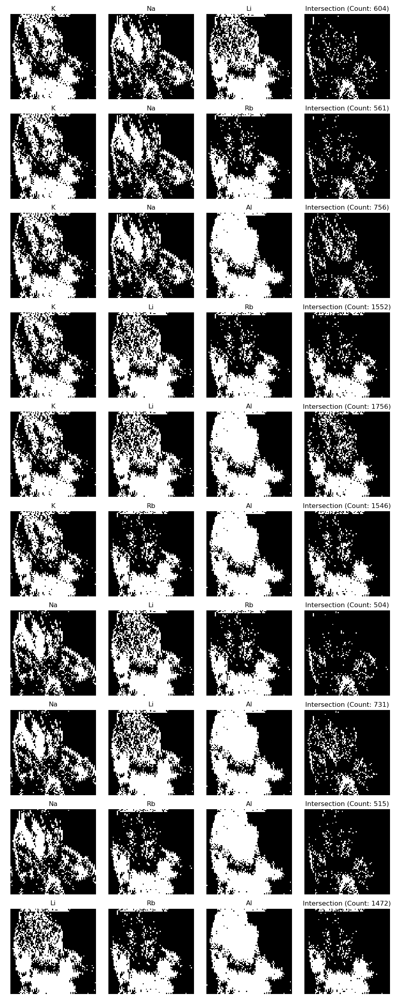

In [29]:
#interseções 3 a 3
excluded_indices = {0, 1, 3}
valid_indices = [i for i in range(len(thresholded_clusters)) if i not in excluded_indices]

# Prepare for plotting
intersections = {}
fig, axes = plt.subplots(
    len(valid_indices) * (len(valid_indices) - 1) * (len(valid_indices) - 2) // 6, 
    4, 
    figsize=(10, 5 * len(valid_indices))
)

plot_index = 0
for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            if i < j < k:  # To avoid duplicate pairs and self-comparisons
                # Calculate intersection as the element-wise logical AND for three clusters
                intersection = np.logical_and(
                    thresholded_clusters[i], 
                    np.logical_and(thresholded_clusters[j], thresholded_clusters[k])
                )
                intersection_count = np.sum(intersection)  # Count the number of intersecting elements

                # Store the result in a dictionary
                intersections[(i, j, k)] = intersection_count

                # Plot the three clusters and their intersection
                ax1, ax2, ax3, ax4 = axes[plot_index]
                ax1.imshow(thresholded_clusters[i], cmap='gray', interpolation='none')
                ax1.set_title(f'{cluster_label[i]}')  # Use the cluster name from cluster_label
                ax1.axis('off')

                ax2.imshow(thresholded_clusters[j], cmap='gray', interpolation='none')
                ax2.set_title(f'{cluster_label[j]}')  # Use the cluster name from cluster_label
                ax2.axis('off')

                ax3.imshow(thresholded_clusters[k], cmap='gray', interpolation='none')
                ax3.set_title(f'{cluster_label[k]}')  # Use the cluster name from cluster_label
                ax3.axis('off')

                ax4.imshow(intersection, cmap='gray', interpolation='none')
                ax4.set_title(f'Intersection (Count: {intersection_count})')
                ax4.axis('off')

                plot_index += 1

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

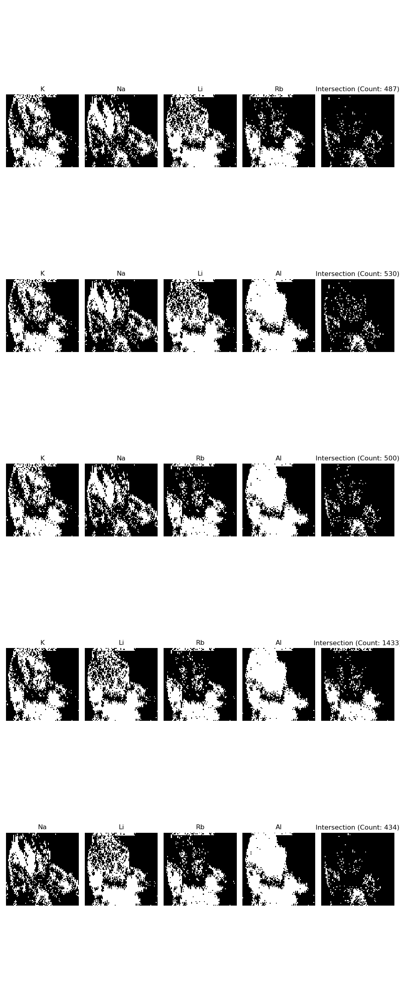

In [30]:
# 4 a 4
# Exclude clusters with indices 0, 1, and 3
excluded_indices = {0, 1, 3}
valid_indices = [i for i in range(len(thresholded_clusters)) if i not in excluded_indices]

# Prepare for plotting
intersections = {}
fig, axes = plt.subplots(
    len(valid_indices) * (len(valid_indices) - 1) * (len(valid_indices) - 2) * (len(valid_indices) - 3) // 24, 
    5, 
    figsize=(10, 5 * len(valid_indices))
)

plot_index = 0
for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            for l in valid_indices:
                if i < j < k < l:  
                    intersection = np.logical_and(
                        thresholded_clusters[i], 
                        np.logical_and(
                            thresholded_clusters[j], 
                            np.logical_and(thresholded_clusters[k], thresholded_clusters[l])
                        )
                    )
                    intersection_count = np.sum(intersection)  

                    intersections[(i, j, k, l)] = intersection_count

                    ax1, ax2, ax3, ax4, ax5 = axes[plot_index]
                    ax1.imshow(thresholded_clusters[i], cmap='gray', interpolation='none')
                    ax1.set_title(f'{cluster_label[i]}') 
                    ax1.axis('off')

                    ax2.imshow(thresholded_clusters[j], cmap='gray', interpolation='none')
                    ax2.set_title(f'{cluster_label[j]}') 
                    ax2.axis('off')

                    ax3.imshow(thresholded_clusters[k], cmap='gray', interpolation='none')
                    ax3.set_title(f'{cluster_label[k]}') 
                    ax3.axis('off')

                    ax4.imshow(thresholded_clusters[l], cmap='gray', interpolation='none')
                    ax4.set_title(f'{cluster_label[l]}')  
                    ax4.axis('off')

                    ax5.imshow(intersection, cmap='gray', interpolation='none')
                    ax5.set_title(f'Intersection (Count: {intersection_count})')
                    ax5.axis('off')

                    plot_index += 1

plt.tight_layout()
plt.show()

In [31]:
excluded_indices = {0, 1, 3}
valid_indices = [i for i in range(len(thresholded_clusters)) if i not in excluded_indices]


selected_intersections = []

# Check 2x2 intersections
for i in valid_indices:
    for j in valid_indices:
        if i < j:
            intersection = np.logical_and(thresholded_clusters[i], thresholded_clusters[j])
            if np.sum(intersection) >= 1000:
                label_string = f"{cluster_label[i]} & {cluster_label[j]}"
                selected_intersections.append(label_string)

# Check 3x3 intersections
for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            if i < j < k:
                intersection = np.logical_and(
                    thresholded_clusters[i], 
                    np.logical_and(thresholded_clusters[j], thresholded_clusters[k])
                )
                if np.sum(intersection) >= 1000:
                    label_string = f"{cluster_label[i]} & {cluster_label[j]} & {cluster_label[k]}"
                    selected_intersections.append(label_string)

# Check 4x4 intersections
for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            for l in valid_indices:
                if i < j < k < l:
                    intersection = np.logical_and(
                        thresholded_clusters[i], 
                        np.logical_and(
                            thresholded_clusters[j], 
                            np.logical_and(thresholded_clusters[k], thresholded_clusters[l])
                        )
                    )
                    if np.sum(intersection) >= 1000:
                        label_string = f"{cluster_label[i]} & {cluster_label[j]} & {cluster_label[k]} & {cluster_label[l]}"
                        selected_intersections.append(label_string)



In [32]:
selected_intersections

['K & Li',
 'K & Rb',
 'K & Al',
 'Na & Al',
 'Li & Rb',
 'Li & Al',
 'Rb & Al',
 'K & Li & Rb',
 'K & Li & Al',
 'K & Rb & Al',
 'Li & Rb & Al',
 'K & Li & Rb & Al']

In [33]:
selected_intersections[0] in selected_intersections[-1]

True

In [34]:
#exclusive interactions
#devia calcular interseções das interseções para saber quais sao repetidas e quais nao?
int_final = []
index_selected=[]

for i in tqdm(range(len(selected_intersections) - 1, 0, -1)):
    current = selected_intersections[i]
    elements = sorted(current.split(' & '), key=lambda x: x.strip())  

    is_subset = False
    for existing in int_final:
        if set(elements).issubset(set(existing)):  
            is_subset = True
            break

    if not is_subset:
        elements.append('Si') #que cobrem toda a amostra
        elements.append('O')
        int_final.append(elements)
        index_selected.append(i)

print(int_final)


100%|██████████| 11/11 [00:00<?, ?it/s]

[['Al', 'K', 'Li', 'Rb', 'Si', 'O'], ['Al', 'Na', 'Si', 'O']]


In [35]:
p_fin=[]
for i in index_selected:
    current = selected_intersections[i]
    elements = sorted(current.split(' & '), key=lambda x: x.strip())  
    pos=[]
    for j in range(len(elements)):
        el_cleaned = elements[j].strip().lower()
        cluster_label_cleaned = [label.strip().lower() for label in cluster_label]
        positions = int(np.where(np.array(cluster_label_cleaned) == el_cleaned)[0])
        pos.append(positions)
    p_fin.append(pos)
    



C:\Users\Joana\AppData\Local\Temp\ipykernel_1992\3391337994.py:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  positions = int(np.where(np.array(cluster_label_cleaned) == el_cleaned)[0])


In [36]:
p_fin
intersection_list=[]
for list in p_fin:
    ind_0=list[0]
    intersection=thresholded_clusters[ind_0]
    for i in range(1,len(list)):
        intersection=np.logical_and(intersection, thresholded_clusters[list[i]])
    intersection_list.append(intersection)

        

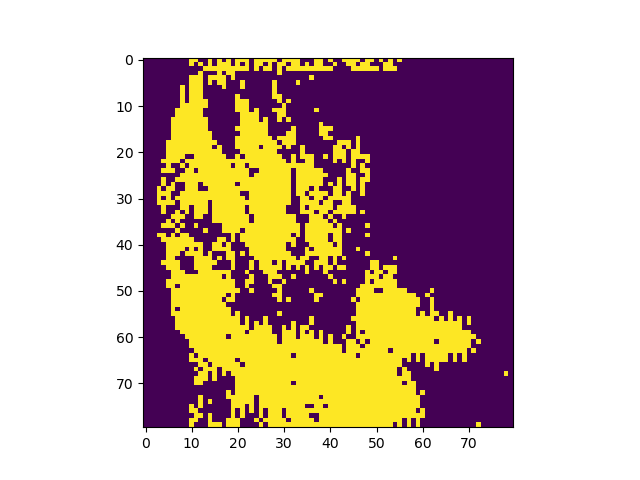

In [37]:
plt.figure()
plt.imshow(np.logical_or(intersection_list[0],intersection_list[1]))
#obviamente estes dois minerais exclusivos não preenchem toda a amostra, é preciso verificar outras interseções

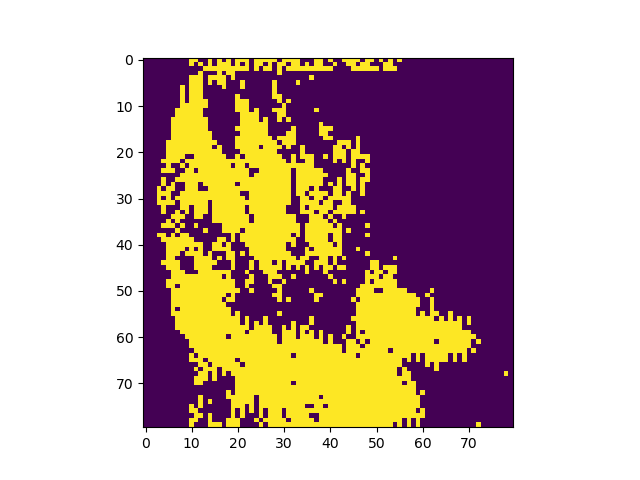

In [38]:
base_map=np.logical_or(intersection_list[0],intersection_list[1])
plt.figure()
plt.imshow(base_map)

In [39]:
import numpy as np

# Assuming `thresholded_clusters` is your array of binary maps for each cluster,
# and `cluster_label` is the array of labels for each cluster.
excluded_indices = {3}
valid_indices = [i for i in range(len(thresholded_clusters)) if i not in excluded_indices]
current_pixel_count = np.sum(base_map)

# List to store smaller intersections and their labels
smaller_intersections = []

# Recalculate and collect all smaller intersections
for i in valid_indices:
    for j in valid_indices:
        if i < j:
            intersection = np.logical_and(thresholded_clusters[i], thresholded_clusters[j])
            if np.sum(intersection) >= 1000:
                smaller_intersections.append((intersection, f"{cluster_label[i]} & {cluster_label[j]}"))

for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            if i < j < k:
                intersection = np.logical_and(
                    thresholded_clusters[i], 
                    np.logical_and(thresholded_clusters[j], thresholded_clusters[k])
                )
                if np.sum(intersection) >= 1000:
                    smaller_intersections.append((intersection, f"{cluster_label[i]} & {cluster_label[j]} & {cluster_label[k]}"))

for i in valid_indices:
    for j in valid_indices:
        for k in valid_indices:
            for l in valid_indices:
                if i < j < k < l:
                    intersection = np.logical_and(
                        thresholded_clusters[i], 
                        np.logical_and(
                            thresholded_clusters[j], 
                            np.logical_and(thresholded_clusters[k], thresholded_clusters[l])
                        )
                    )
                    if np.sum(intersection) >= 1000:
                        smaller_intersections.append((intersection, f"{cluster_label[i]} & {cluster_label[j]} & {cluster_label[k]} & {cluster_label[l]}"))

# Iterate over smaller intersections to check if they increase the number of "1" pixels
useful_intersections = []

for intersection, label in smaller_intersections:
    new_map = np.logical_or(base_map, intersection).astype(int)
    new_pixel_count = np.sum(new_map)
    
    if new_pixel_count > current_pixel_count:
        useful_intersections.append(label)  # Keep track of the label
        #base_map = new_map  # Update the base map to include this intersection
        current_pixel_count = new_pixel_count  # Update the pixel count

# useful_intersections now contains the labels of intersections that increased the pixel count
print("Useful intersections:", useful_intersections)


Useful intersections: ['Si & O']


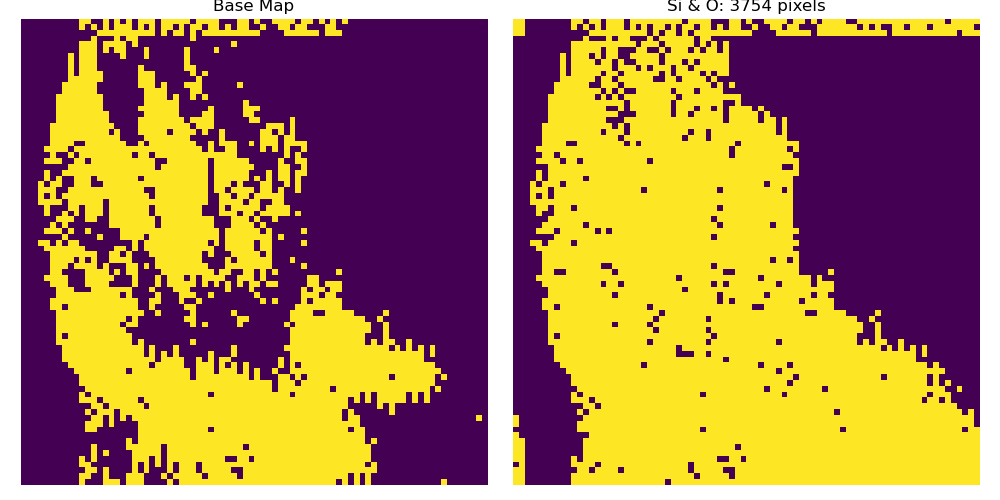

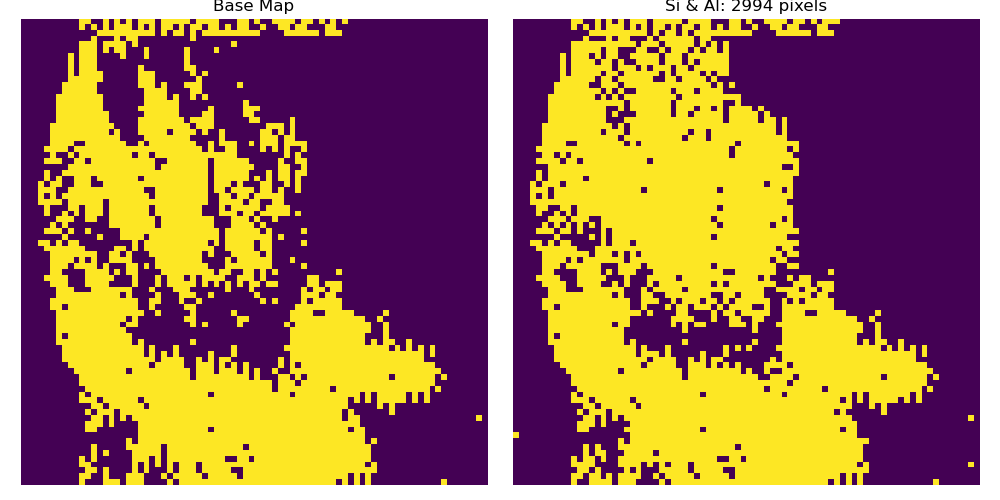

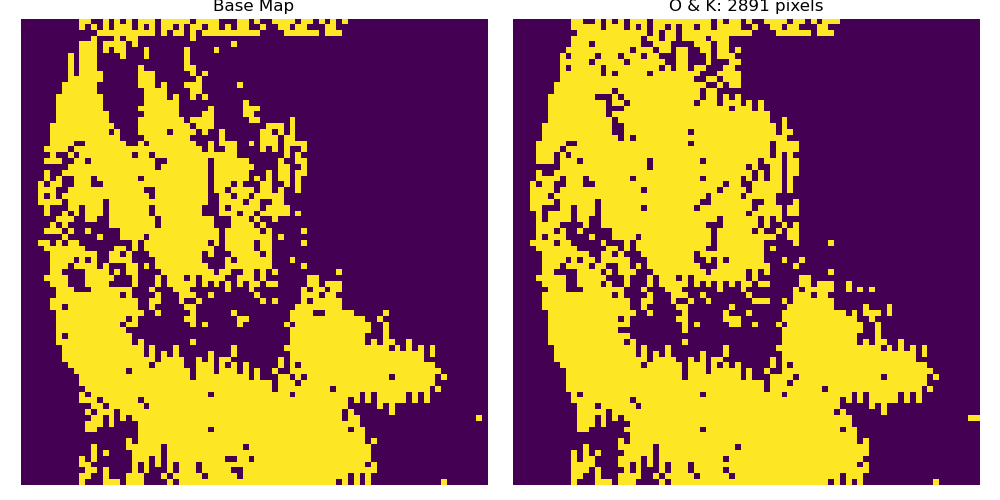

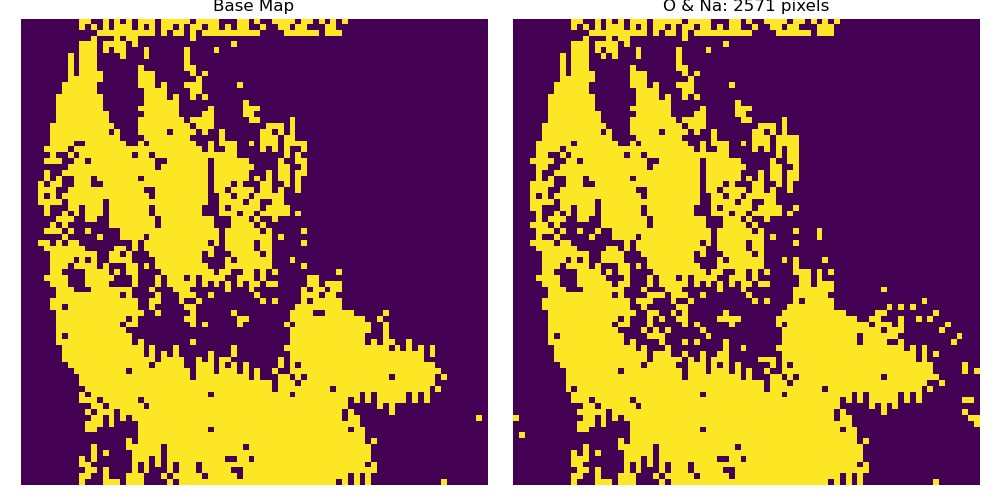

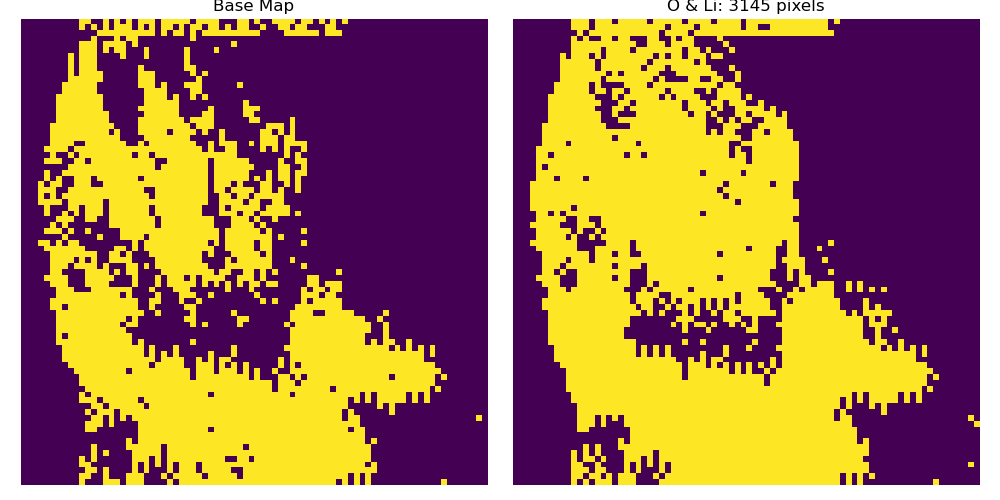

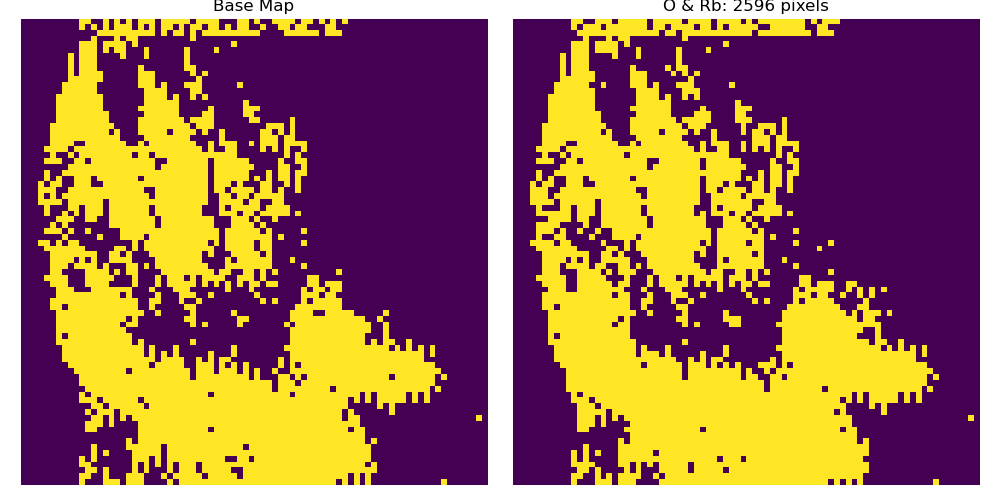

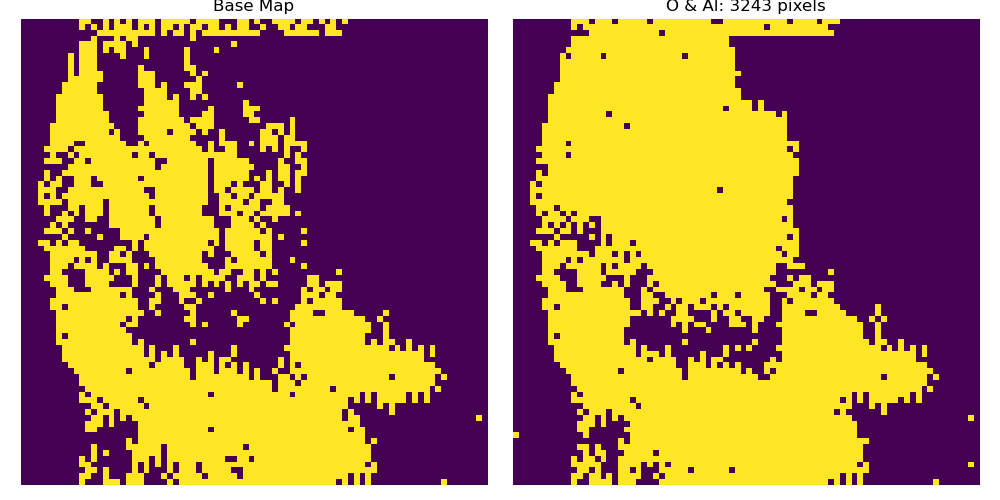

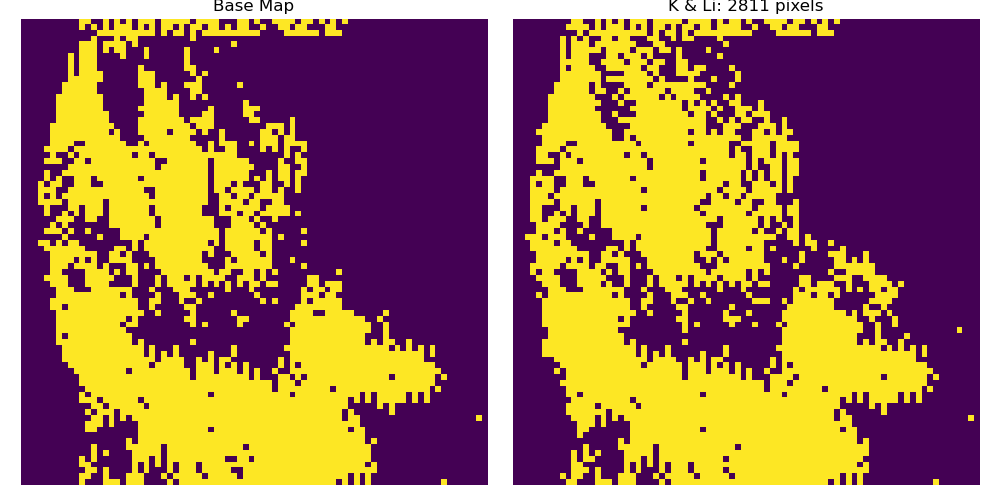

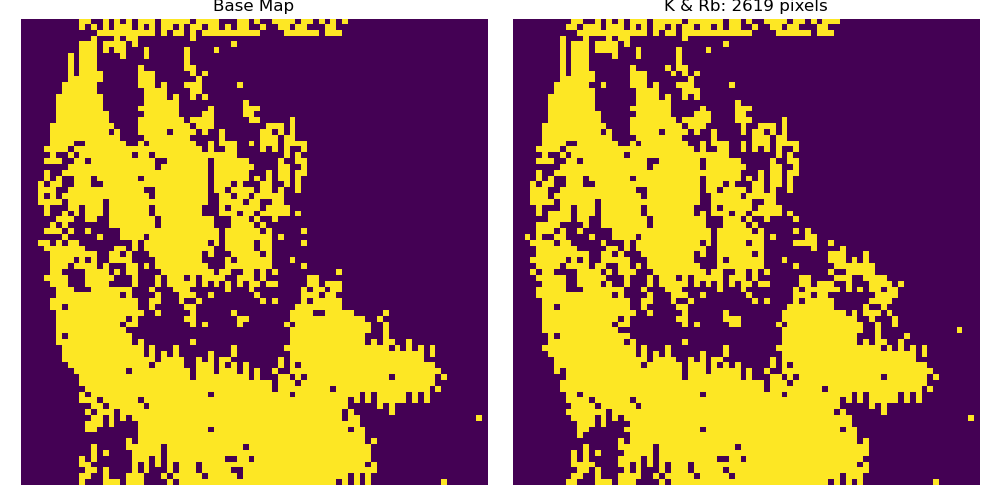

C:\Users\Joana\AppData\Local\Temp\ipykernel_1992\867410856.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))


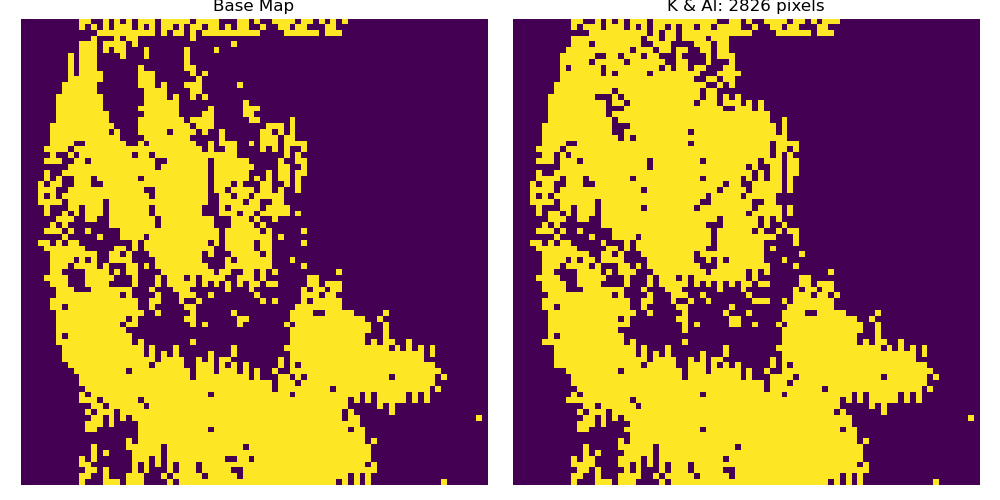

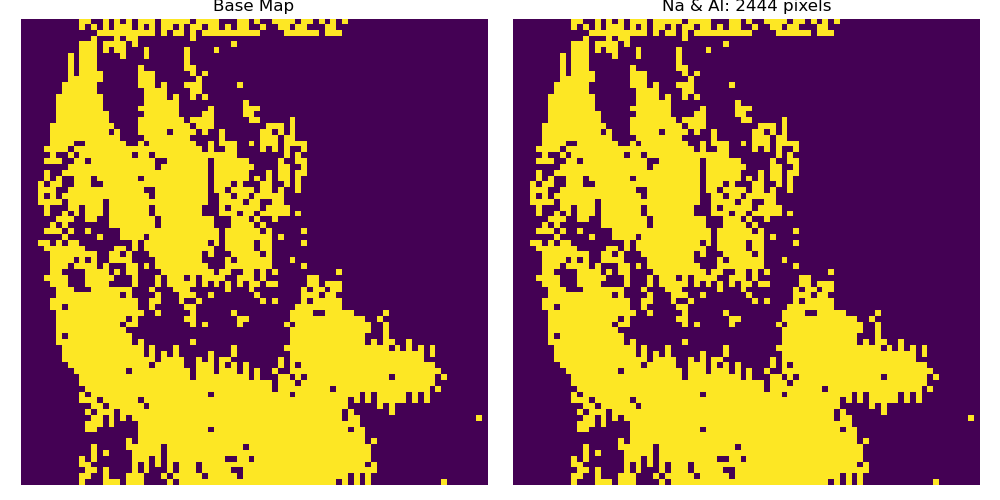

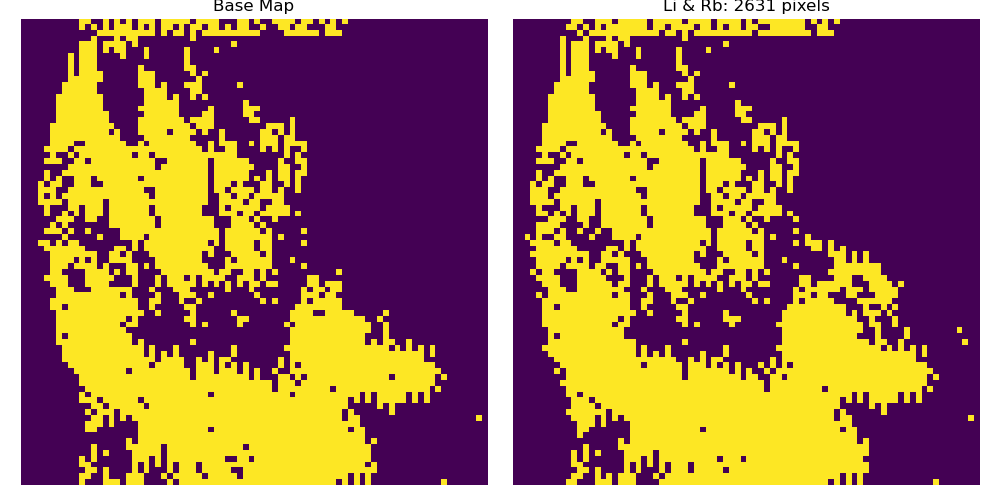

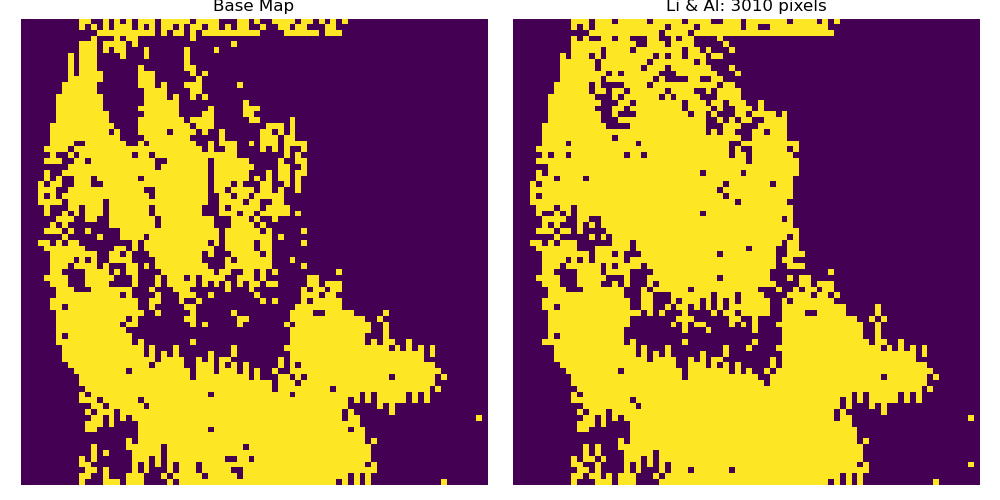

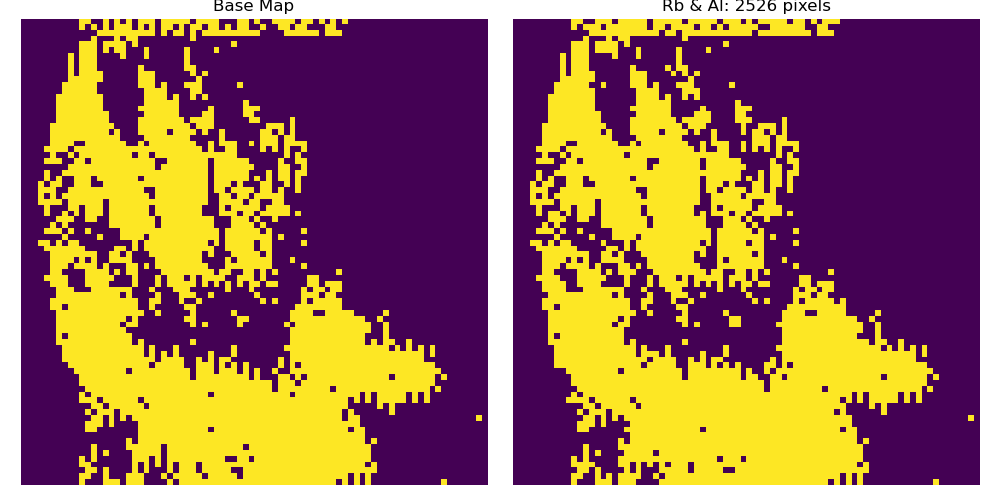

...

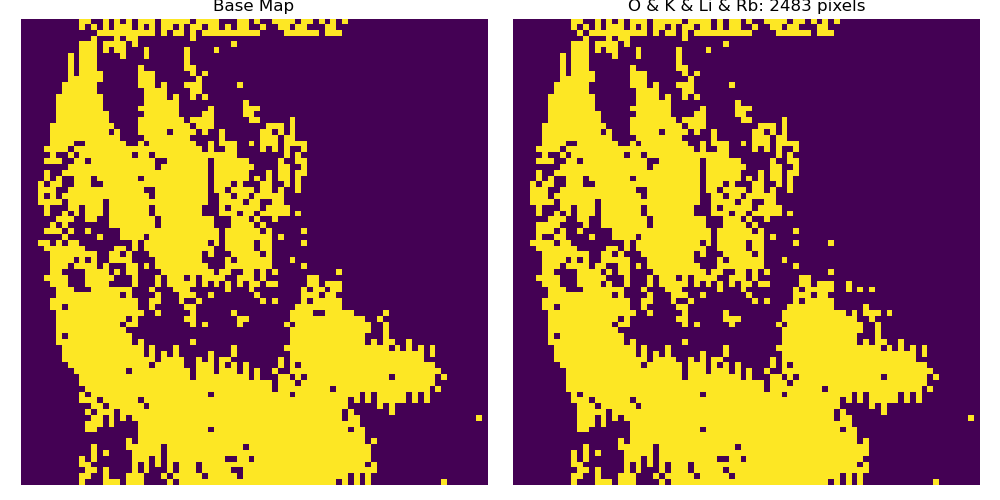

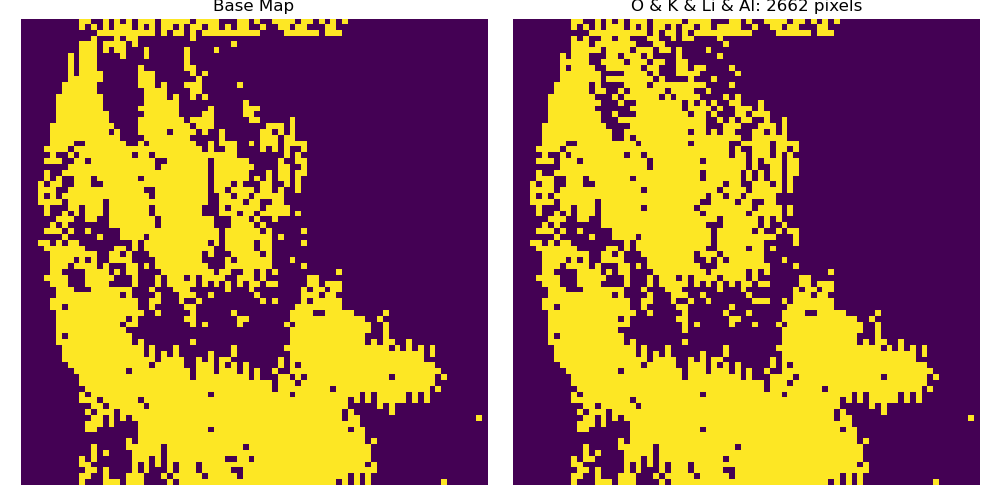

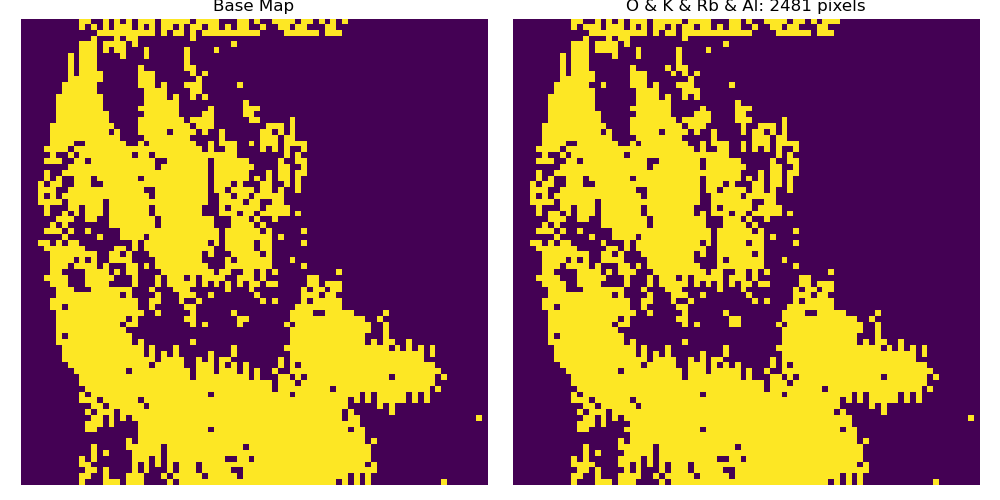

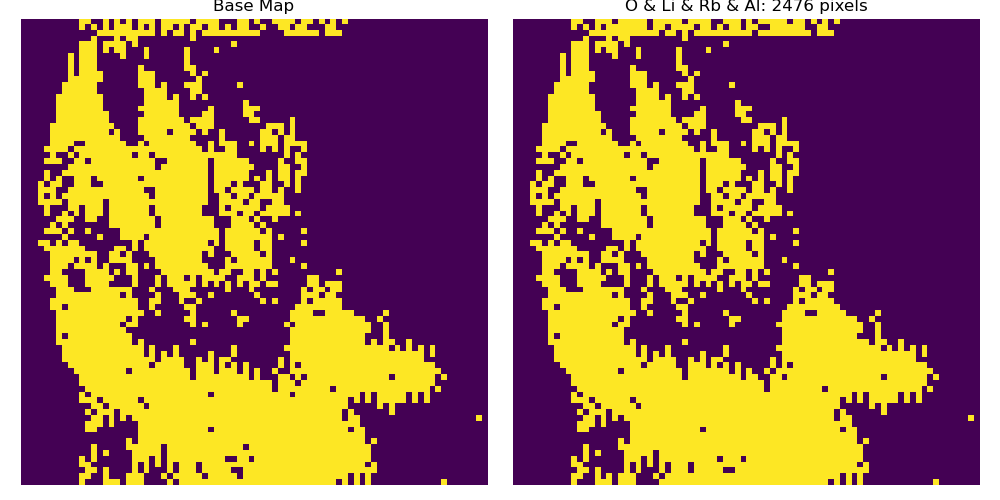

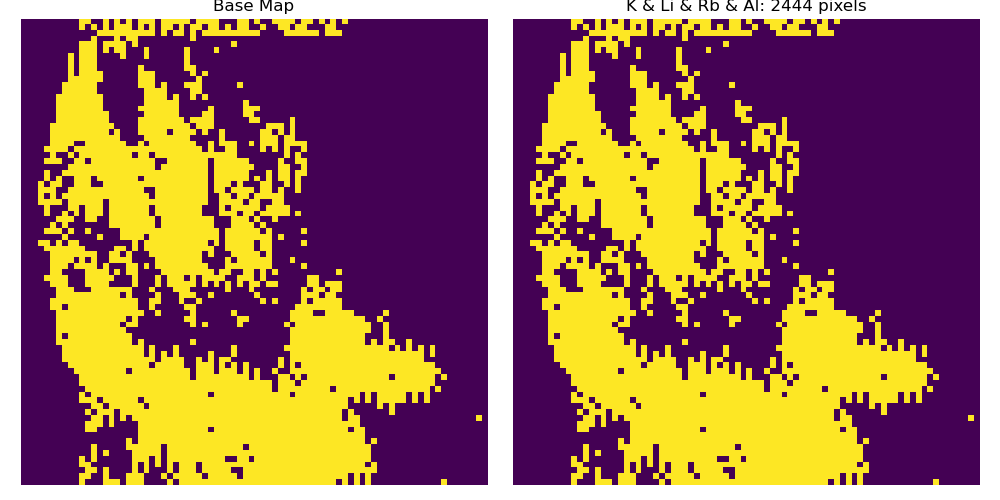

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming `thresholded_clusters`, `cluster_label`, `base_map`, and `smaller_intersections` are already defined

# Iterate over smaller intersections to visualize each union with the base map side by side
for intersection, label in smaller_intersections:
    # Create the new map by taking the union of the base map and the intersection
    new_map = np.logical_or(base_map, intersection).astype(int)
    new_pixel_count = np.sum(new_map)
    
    # Create a figure and axes for side-by-side plots
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    # Plot the base map
    ax[0].imshow(base_map, interpolation='none')
    ax[0].set_title("Base Map")
    ax[0].axis('off')  # Turn off axes for cleaner visualization

    # Plot the union map (base map + intersection)
    ax[1].imshow(new_map, interpolation='none')
    ax[1].set_title(f"{label}: {new_pixel_count} pixels")
    ax[1].axis('off')  # Turn off axes for cleaner visualization

    # Display the plot
    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()


In [41]:
# Si e O claramente é mais um dos minerais
int_final.append(['Si','O'])
print(int_final)

[['Al', 'K', 'Li', 'Rb', 'Si', 'O'], ['Al', 'Na', 'Si', 'O'], ['Si', 'O']]


([], [])

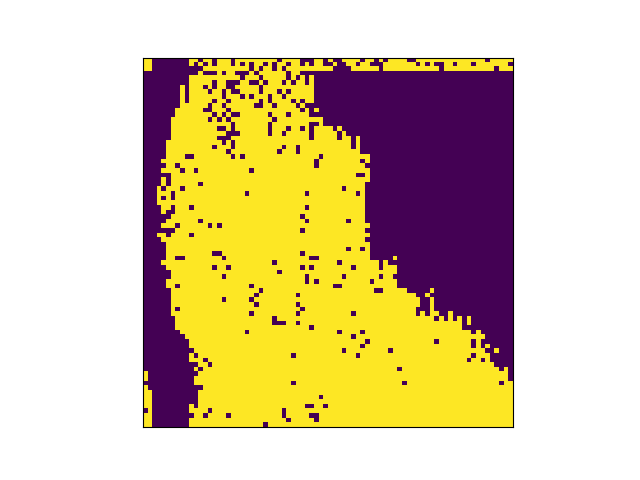

In [42]:
base_map_updated=np.logical_or(base_map,smaller_intersections[0][0])
plt.figure()
plt.imshow(base_map_updated)
plt.xticks([])
plt.yticks([])

#falta um mineral mas como sao elementos repetidos ja parece cheio

In [43]:
smaller_intersections[0][0]

array([[ True,  True, False, ...,  True,  True,  True],
       [ True,  True, False, ...,  True,  True, False],
       [ True,  True, False, ...,  True,  True,  True],
       ...,
       [ True,  True, False, ...,  True,  True,  True],
       [ True,  True, False, ...,  True,  True,  True],
       [ True,  True, False, ...,  True,  True,  True]])

In [44]:
n_clusters=5
kmeans = sklearn.cluster.KMeans(n_clusters = n_clusters,random_state=0)

kmeans.fit_predict(clusters_c.reshape(-1,clusters_reshaped.shape[1]*clusters_reshaped.shape[2]))
labels_2 = kmeans.labels_
clusters_c_2 = np.array(kmeans.cluster_centers_)

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


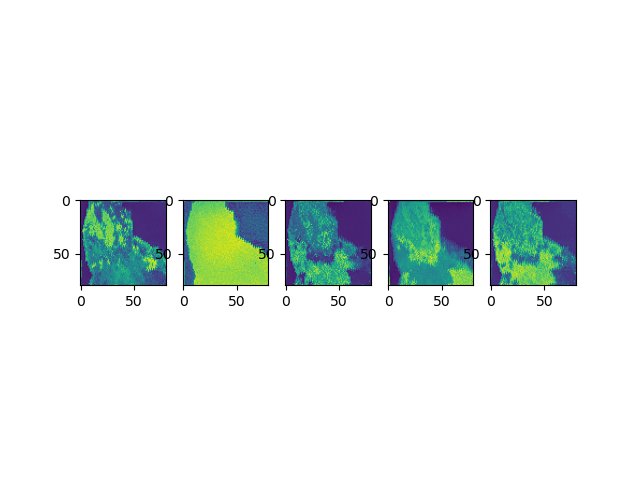

In [45]:
fig,ax=subplots(1,clusters_c_2.shape[0])
for i in range(clusters_c_2.shape[0]):
    ax[i].imshow(clusters_c_2[i].reshape(clusters_reshaped.shape[1],clusters_reshaped.shape[2]))


Lepidolite K(Li,Al)3(Al,Si,Rb)4O10(F,OH)2

Muscovite KAl2(Si3Al)O10(OH,F)2

Albite NaAlSi3O8

Quartz SiO2

In [46]:
thresholded_clusters

array([[[ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True, False],
        [ True,  True, False, ...,  True,  True,  True],
        ...,
        [ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True]],

       [[ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True],
        ...,
        [ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

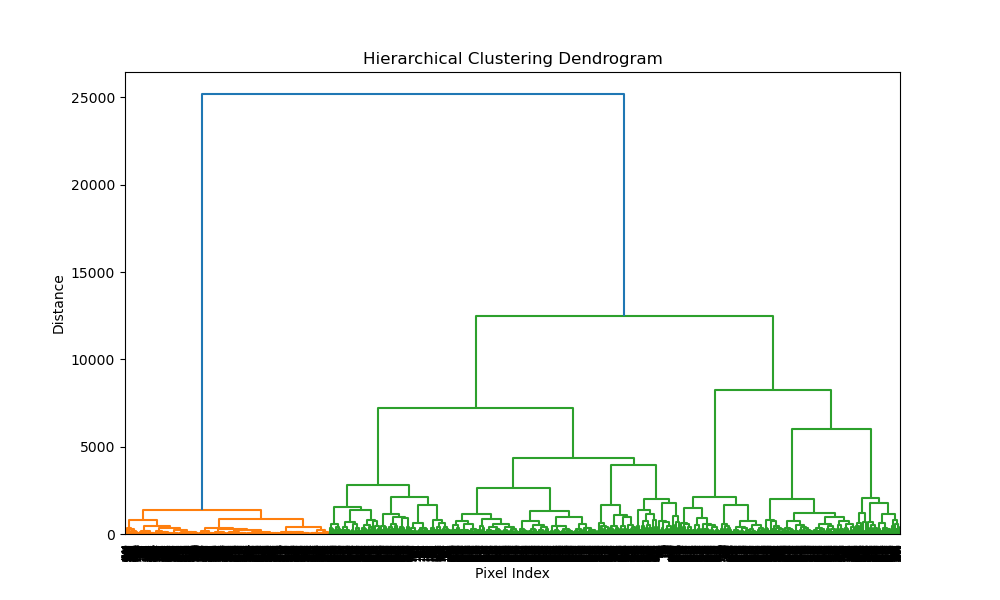

In [47]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
clusters_g=gaussian_filter((clusters_reshaped),sigma=0.2)
num_elements, x_size, y_size = clusters_reshaped.shape
data_reshaped = clusters_g.reshape(num_elements, -1).T  # Shape: (number of pixels, number of elements)

# Step 2: Perform hierarchical clustering
linkage_matrix = linkage(data_reshaped,method='ward')  # 'ward' minimizes variance within clusters

# Step 3: Visualize the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Pixel Index")
plt.ylabel("Distance")
plt.show()


In [48]:
distance_threshold = 7000 # Adjust based on your data
clusters = fcluster(linkage_matrix, t=distance_threshold, criterion='distance')

# Step 5: Reshape the clusters back to the original image shape for visualization
cluster_map = clusters.reshape(x_size, y_size)


Text(0.5, 1.0, 'Clustered Mineral Map')

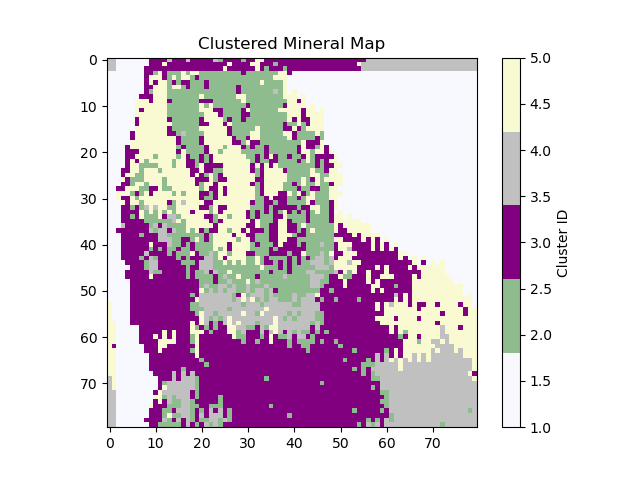

In [49]:
colors = [ 'ghostwhite','darkseagreen','Purple', 'silver','lightgoldenrodyellow',]
#mineral_list=['Muscovite','Albite','Quartz','Spodumene','Background']
from matplotlib.colors import ListedColormap
cmp_libs = ListedColormap(colors)
plt.figure()
plt.imshow(cluster_map,cmap=cmp_libs,interpolation='none')
plt.colorbar(label='Cluster ID')
plt.title("Clustered Mineral Map")

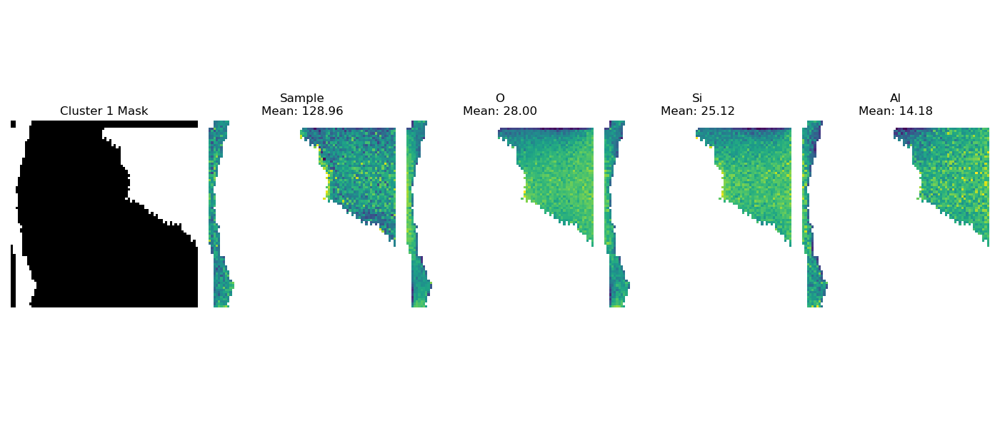

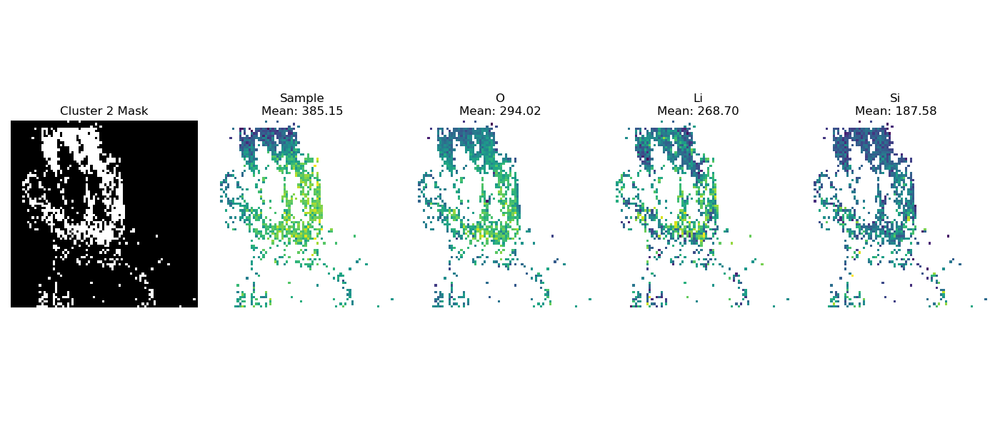

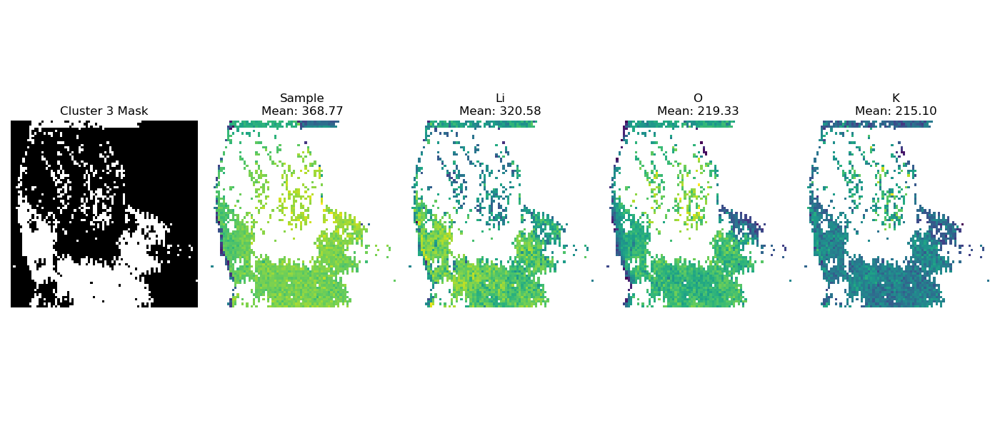

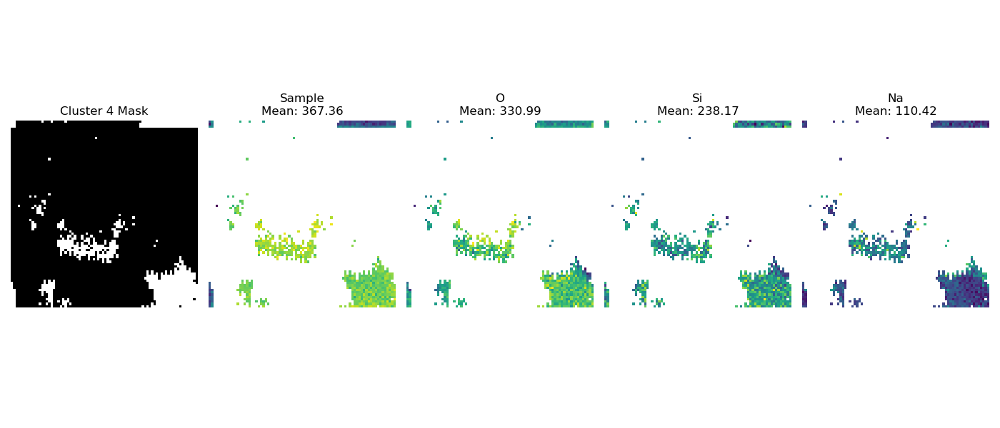

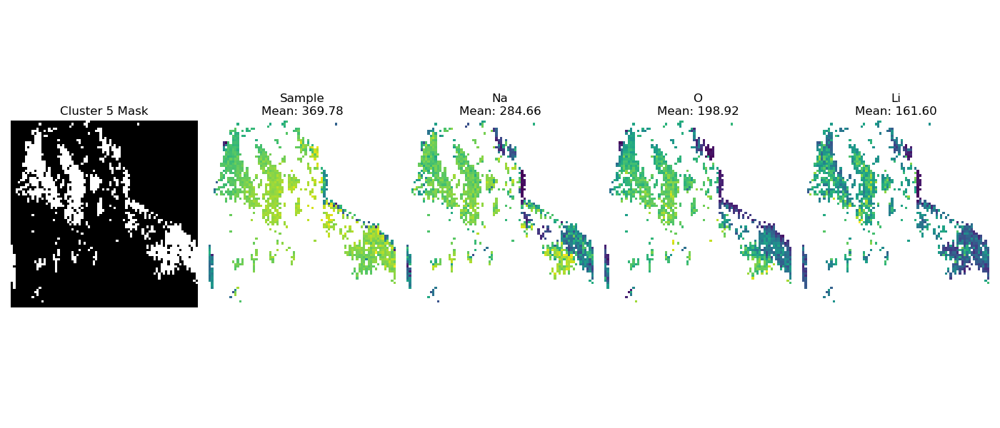

In [50]:
# Step 4: Visualize element maps and rank contributions for each cluster
unique_clusters = np.unique(clusters)
for cluster_id in unique_clusters:
    # Create a mask for pixels that belong to the current cluster
    mask = (cluster_map == cluster_id)

    # Calculate the mean intensity for each element within the cluster
    mean_intensities = [np.mean(clusters_reshaped[element_index][mask]) for element_index in range(num_elements)]

    # Rank the elements by their mean intensity
    top_elements_indices = np.argsort(mean_intensities)[-4:][::-1]  # Get the indices of the top 4 elements

    # Plot the cluster mask
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 5, 1)
    plt.imshow(mask, cmap='gray')
    plt.title(f"Cluster {cluster_id} Mask")
    plt.axis('off')

    # Plot the maps of the top 4 elements
    for i, element_index in enumerate(top_elements_indices):
        element_map = clusters_reshaped[element_index]
        # Mask the element map to show only the cluster's pixels
        element_map_masked = np.ma.masked_where(~mask, element_map)
        mean_intensity = mean_intensities[element_index]
        element_name = cluster_label[element_index]

        plt.subplot(1, 5, i + 2)
        plt.imshow(element_map_masked, cmap='viridis')
        plt.title(f"{element_name}\nMean: {mean_intensity:.2f}")
        plt.axis('off')

    plt.tight_layout()
  

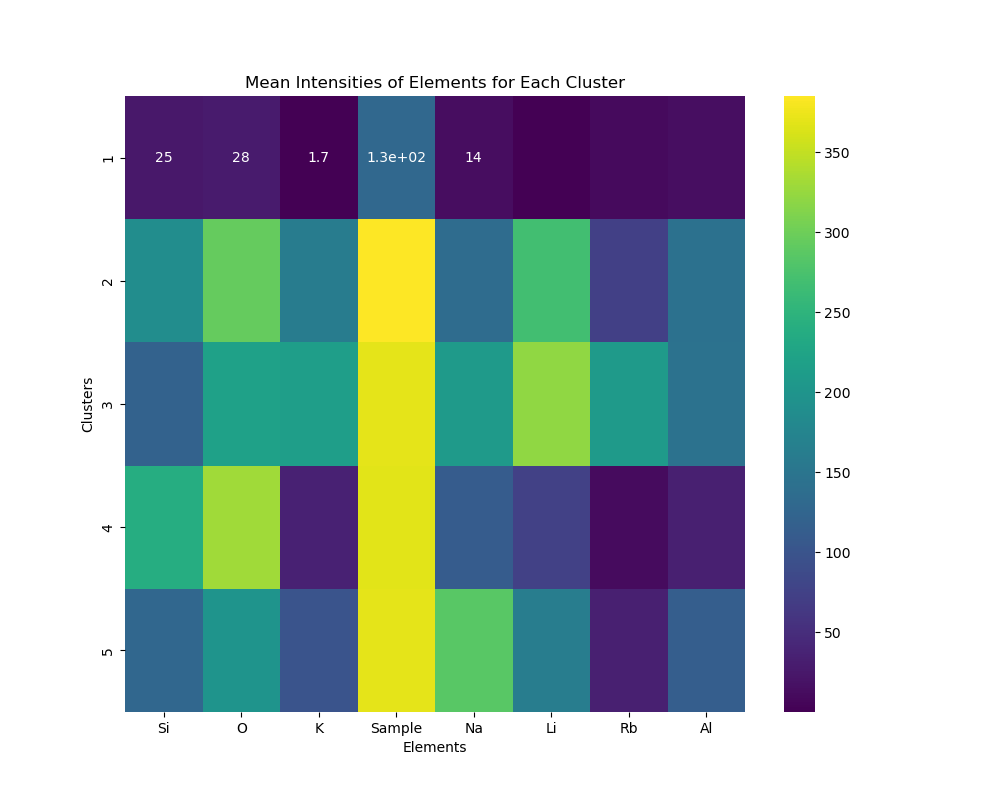

In [51]:
import seaborn as sns

# Calculate mean intensities for all elements across all clusters
mean_intensity_matrix = np.zeros((len(unique_clusters), num_elements))
for i, cluster_id in enumerate(unique_clusters):
    mask = (cluster_map == cluster_id)
    for element_index in range(num_elements):
        mean_intensity_matrix[i, element_index] = np.mean(clusters_reshaped[element_index][mask])

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(mean_intensity_matrix, annot=True, cmap='viridis', xticklabels=cluster_label, yticklabels=unique_clusters)
plt.xlabel("Elements")
plt.ylabel("Clusters")
plt.title("Mean Intensities of Elements for Each Cluster")
plt.show()


In [52]:
# com os thresholded clusters

: 

In [53]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
clusters_g=gaussian_filter(thresholded_clusters,sigma=0.2)
num_elements, x_size, y_size = clusters_reshaped.shape
data_reshaped = clusters_g.reshape(num_elements, -1).T  # Shape: (number of pixels, number of elements)

# Step 2: Perform hierarchical clustering
linkage_matrix = linkage(data_reshaped, method='ward')  # 'ward' minimizes variance within clusters

# Step 3: Visualize the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Pixel Index")
plt.ylabel("Distance")
plt.show()

distance_threshold = 7000  # Adjust based on your data
clusters = fcluster(linkage_matrix, t=distance_threshold, criterion='distance')

# Step 5: Reshape the clusters back to the original image shape for visualization
cluster_map = clusters.reshape(x_size, y_size)


Text(0.5, 1.0, 'Clustered Mineral Map')

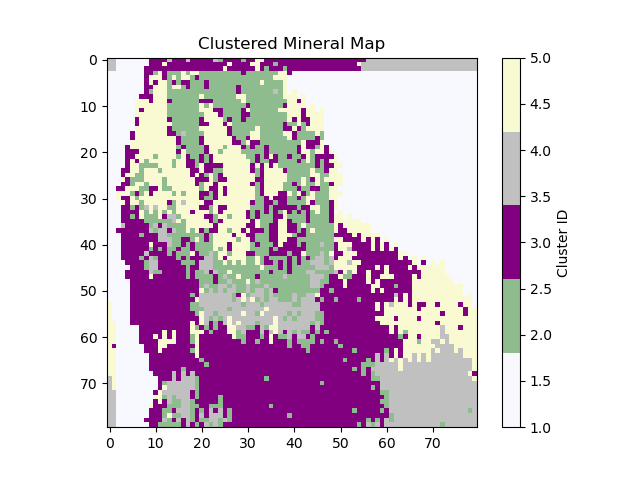

In [ ]:
colors = [ 'ghostwhite','darkseagreen','Purple', 'silver','lightgoldenrodyellow',]
#mineral_list=['Muscovite','Albite','Quartz','Spodumene','Background']
from matplotlib.colors import ListedColormap
cmp_libs = ListedColormap(colors)
plt.figure()
plt.imshow(cluster_map,cmap=cmp_libs,interpolation='none')
plt.colorbar(label='Cluster ID')
plt.title("Clustered Mineral Map")

## análise dos mapas selecionados

In [84]:
sel_maps.shape

(179, 80, 80)

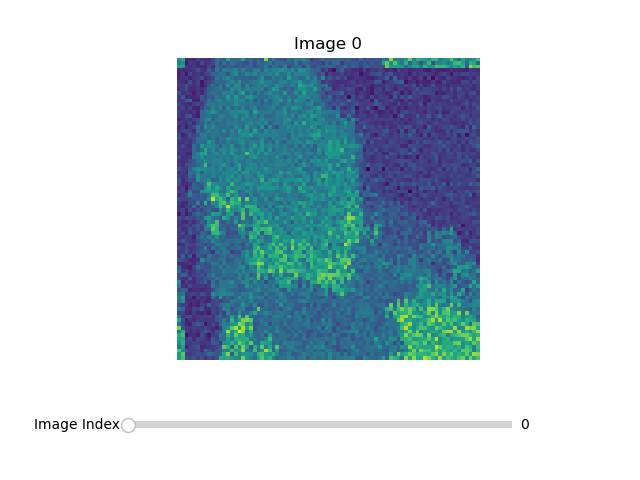

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

# Create a figure and initial plot
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)  # Adjust the bottom to make room for the slider

# Display the first image
image = ax.imshow(sel_maps[0], cmap='viridis')
ax.set_title("Image 0")
ax.axis('off')  # Hide the axes if not needed

# Create a slider axis and slider
ax_slider = plt.axes([0.2, 0.1, 0.6, 0.03], facecolor='lightgrey')
slider = Slider(ax_slider, 'Image Index', 0, sel_maps.shape[0] - 1, valinit=0, valstep=1)

# Update function for the slider
def update(val):
    index = int(slider.val)
    image.set_data(sel_maps[index])
    ax.set_title(f"Image {index}")
    fig.canvas.draw_idle()

# Connect the update function to the slider
slider.on_changed(update)

plt.show()


In [45]:
#todos os mapas sem background
sel_maps=maps

sel_maps_f=sel_maps.reshape(-1,sel_maps.shape[1]*sel_maps.shape[2])
thresholds=np.array([threshold_otsu(sel_maps_f[i]) for i in range(sel_maps.shape[0])])
final_masks=[]
for map in range(len(thresholds)):
    c_mask=np.zeros(sel_maps_f.shape[1])
    for i in range(sel_maps_f.shape[1]):
        if sel_maps_f[map,i]>thresholds[map]:
            c_mask[i]=1
    final_masks.append(c_mask)

final_masks=np.array(final_masks).reshape(-1,sel_maps.shape[1],sel_maps.shape[2])


new_maps=[]
edge=[]
for w in tqdm(range(sel_maps.shape[0])):
    current_map=final_masks[w,:,:]
    pixel_sum=np.sum(current_map[10:30,60:])
    if pixel_sum <1:
        new_maps.append(sel_maps[w,:,:])
new_maps=np.array(new_maps)
print(sel_maps.shape)
print(new_maps.shape)

100%|██████████| 14336/14336 [00:00<00:00, 38351.91it/s]

(14336, 80, 80)
(301, 80, 80)


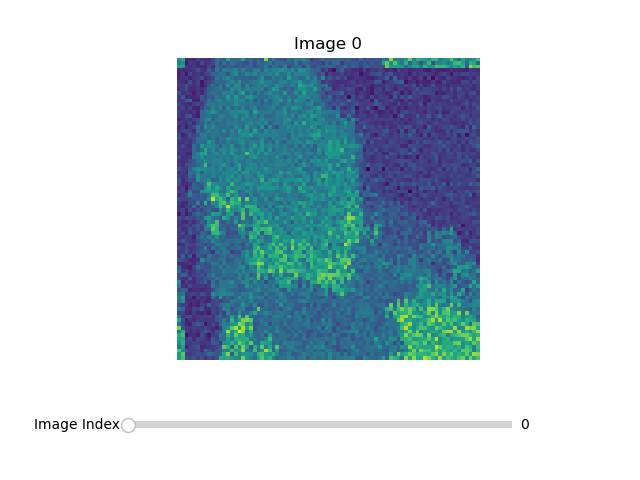

In [97]:

fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)  
image = ax.imshow(new_maps[0], cmap='viridis')
ax.set_title("Image 0")
ax.axis('off') 

ax_slider = plt.axes([0.2, 0.1, 0.6, 0.03], facecolor='lightgrey')
slider = Slider(ax_slider, 'Image Index', 0, new_maps.shape[0] - 1, valinit=0, valstep=1)

def update(val):
    index = int(slider.val)
    image.set_data(new_maps[index])
    ax.set_title(f"Image {index}")
    fig.canvas.draw_idle()

slider.on_changed(update)

plt.show()


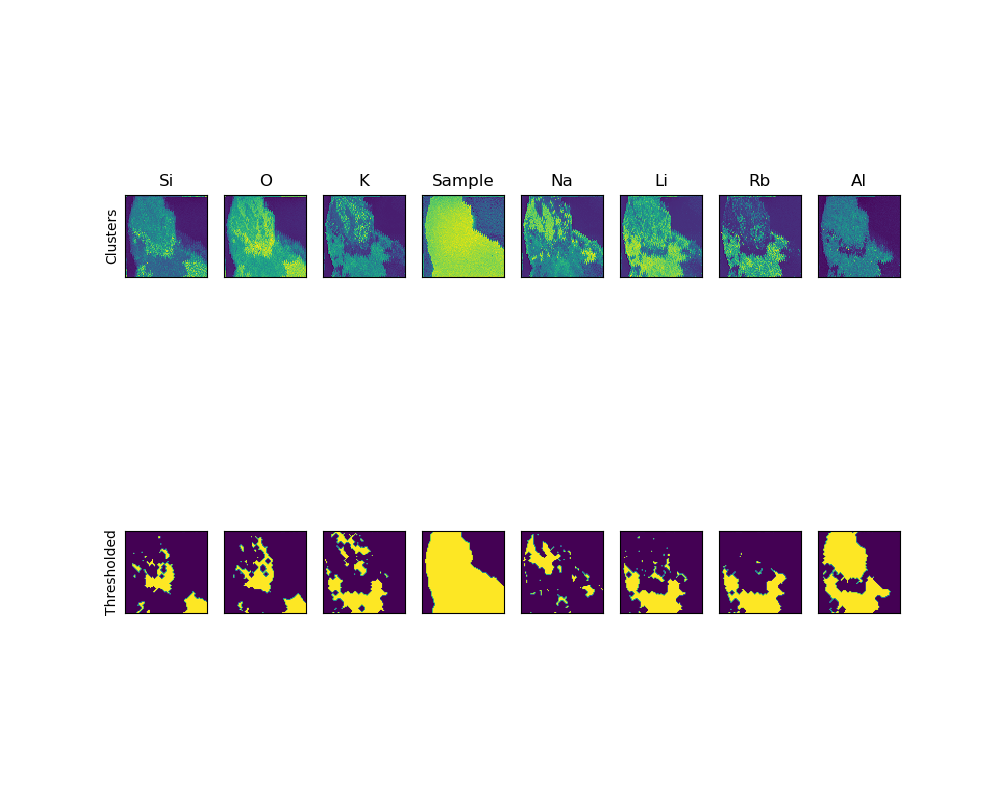

In [46]:
fig,ax=subplots(2,n_clusters,figsize=(10,8))
from skimage.filters import threshold_isodata
from skimage.morphology import erosion, disk,square, closing

thresholded_clusters=[]
clusters_reshaped=clusters_c.reshape(-1,spectrum.shape[1],spectrum.shape[2])
for i in range(n_clusters):
    ax[0,i].imshow(clusters_reshaped[i], interpolation = 'none')
    ax[0,i].set_title(cluster_label[i])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    ax[0,0].set_ylabel('Clusters')


    t=threshold_isodata(clusters_reshaped[i,:,10:40])# a threshold tem de ser definida só dentro da amostra
    cluster_t=clusters_reshaped[i].copy()>t
    cleaned_map = erosion(cluster_t, square(2))
    cleaned_map = closing(cleaned_map, disk(2))  # disk(2) or other sizes
    thresholded_clusters.append(cleaned_map)
    ax[1,i].imshow(cleaned_map)


    ax[1,0].set_ylabel('Thresholded')
thresholded_clusters=np.array(thresholded_clusters)

In [47]:
new_maps.shape

(301, 80, 80)

In [48]:
## thresholding de todos os mapas

thresholds=np.array([threshold_isodata(new_maps[i,:,10:40]) for i in range(new_maps.shape[0])])
new_maps=new_maps.reshape(-1,new_maps.shape[1]*new_maps.shape[2])
maps_thres=[]
for i in range(new_maps.shape[0]):
    c_mask=np.zeros(new_maps.shape[1])
    for j in range(new_maps.shape[1]):
        if new_maps[i][j]>thresholds[i]:
            c_mask[j]=1
    maps_thres.append(c_mask)
maps_thres=np.array(maps_thres)  

In [49]:
maps_thres=maps_thres.reshape(-1,sel_maps.shape[1],sel_maps.shape[2])

In [50]:
for i in range(maps_thres.shape[0]):
    cleaned_map = erosion(maps_thres[i], square(2))
    cleaned_map = closing(cleaned_map, disk(2))  # disk(2) or other sizes
    maps_thres[i]=cleaned_map
    

In [51]:
intersections_c=[]
cluster_groups=[]
for i in range(maps_thres.shape[0]):
    intersections=[]
    clusters_n=[]
    for j in range(thresholded_clusters.shape[0]):
        if j==3:
            cont=0
        else:
            cont=np.sum(np.logical_and(maps_thres[i],thresholded_clusters[j]))/np.sum(maps_thres[i])
        intersections.append(cont)
        if cont>0.6:
            clusters_n.append(j)

    intersections_c.append(intersections)
    cluster_groups.append(clusters_n)

C:\Users\Joana\AppData\Local\Temp\ipykernel_5316\2944122447.py:10: RuntimeWarning: invalid value encountered in scalar divide
  cont=np.sum(np.logical_and(maps_thres[i],thresholded_clusters[j]))/np.sum(maps_thres[i])


In [52]:
intersections_c=np.array(intersections_c)
intersections_c.shape

(301, 8)

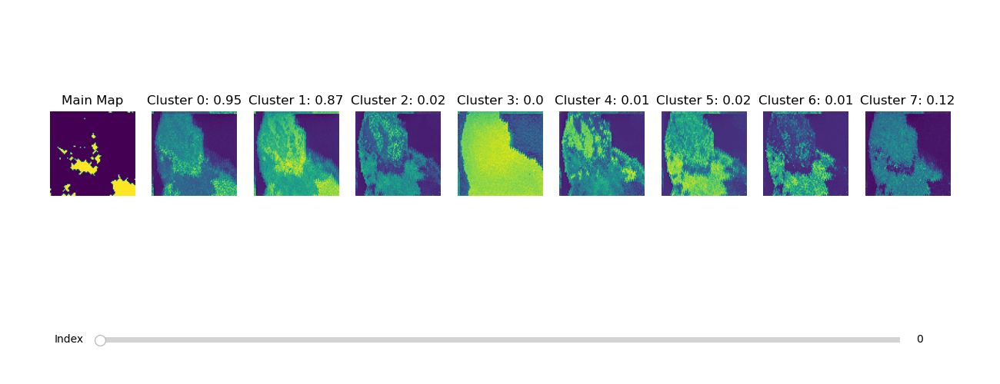

In [53]:
%matplotlib widget
# Create the figure and initial plots
fig, axes = plt.subplots(1, thresholded_clusters.shape[0] + 1, figsize=(13, 5))
plt.subplots_adjust(left=0.05, bottom=0.25, right=0.95, top=0.95)

# Plot the main new_map[i]
main_im = axes[0].imshow(maps_thres[0], cmap='viridis')
axes[0].set_title("Main Map")

# Remove x and y ticks for the main map
axes[0].axis('off')

# Plot the thresholded clusters
cluster_ims = []
for j in range(thresholded_clusters.shape[0]):
    cluster_im = axes[j + 1].imshow(clusters_reshaped[j], cmap='viridis')
    cluster_ims.append(cluster_im)
    axes[j + 1].set_title(f"Cluster {j}: {round(intersections_c[0, j],2)}")
    axes[j + 1].axis('off')  # Remove x and y ticks for each cluster plot

ax_slider = plt.axes([0.1, 0.1, 0.8, 0.03], facecolor='lightgoldenrodyellow')
slider = Slider(ax_slider, 'Index', 0, maps_thres.shape[0] - 1, valinit=0, valstep=1)

def update(val):
    i = int(slider.val)
    main_im.set_data(maps_thres[i])
    
    for j, cluster_im in enumerate(cluster_ims):
        cluster_im.set_data(clusters_reshaped[j])
        axes[j + 1].set_title(f"Cluster {j}: {round(intersections_c[i, j],2)}")
    
    fig.canvas.draw_idle()

slider.on_changed(update)

plt.show()



In [54]:
from collections import defaultdict

# Create a dictionary to store unique entries and their counts
counts_dict = defaultdict(int)

for group in cluster_groups:
    counts_dict[tuple(group)] += 1

# Convert defaultdict to a regular dictionary
counts_dict = dict(counts_dict)

print(counts_dict)

{(0, 1): 118, (0,): 18, (): 15, (7,): 32, (1, 7): 1, (2,): 4, (2, 5, 6, 7): 57, (2, 7): 11, (4, 7): 42, (2, 6, 7): 2, (1,): 1}


In [55]:
for indexes, count in counts_dict.items():
    print(indexes)

(0, 1)
(0,)
()
(7,)
(1, 7)
(2,)
(2, 5, 6, 7)
(2, 7)
(4, 7)
(2, 6, 7)
(1,)


In [56]:
# Create a new dictionary with names instead of indexes
named_counts_dict = {}

for indexes, count in counts_dict.items():
    if indexes == ():
        continue
    # Replace each index with the corresponding name from cluster_label
    else:
        named_keys = [cluster_label[index] for index in indexes]
        named_counts_dict[tuple(named_keys)] = count

print(named_counts_dict)

{('Si', 'O'): 118, ('Si',): 18, ('Al',): 32, ('O', 'Al'): 1, ('K',): 4, ('K', 'Li', 'Rb', 'Al'): 57, ('K', 'Al'): 11, ('Na', 'Al'): 42, ('K', 'Rb', 'Al'): 2, ('O',): 1}


In [57]:
named_counts_dict = {key: value for key, value in named_counts_dict.items() if len(key) > 1}

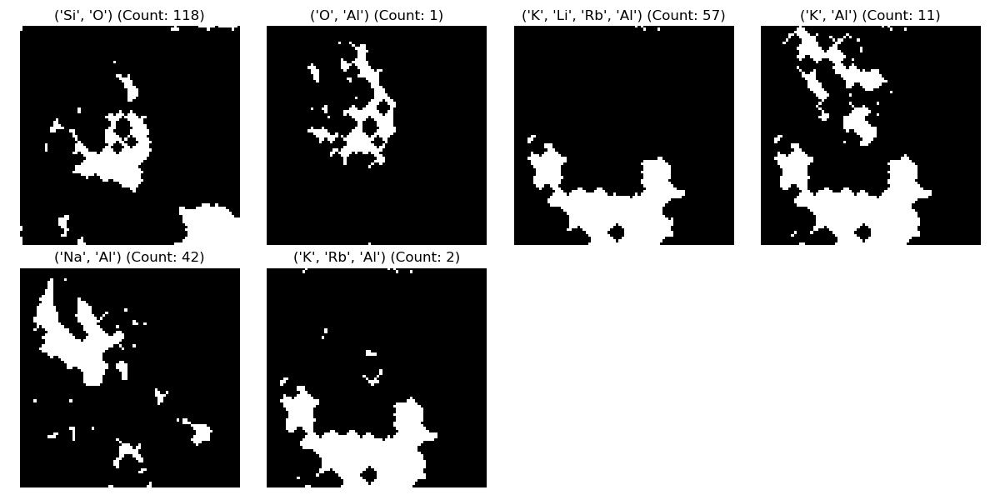

In [58]:
def calculate_intersection(indices):
    # Start with the first cluster's elements
    intersection = thresholded_clusters[indices[0]]
    
    # Apply np.logical_and across the selected clusters
    for index in indices[1:]:
        intersection = np.logical_and(intersection, thresholded_clusters[index])
    
    return intersection

# Create a figure and axes for plotting
num_plots = len(named_counts_dict)  # Number of unique combinations to plot
cols = 4  # Number of columns for the plots (you can adjust as needed)
rows = (num_plots // cols) + (num_plots % cols > 0)  # Number of rows needed

fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))  # 2 rows and multiple columns
axes = axes.flatten()  # Flatten axes for easy iteration

# Iterate through the dictionary and plot each intersection
for i, (names, count) in enumerate(named_counts_dict.items()):
    # Convert cluster names back to indices
    indices = [cluster_label.index(name) for name in names]
    
    # Calculate the intersection using np.logical_and
    intersection = calculate_intersection(indices)
    
    # Plot the intersection with imshow
    ax = axes[i]
    im = ax.imshow(intersection, cmap='gray')
    ax.set_title(f"{names} (Count: {count})")
    ax.axis('off')  # Hide axes for cleaner plot

# Remove any unused axes (if the number of plots is less than the grid size)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

(4, 80, 80)


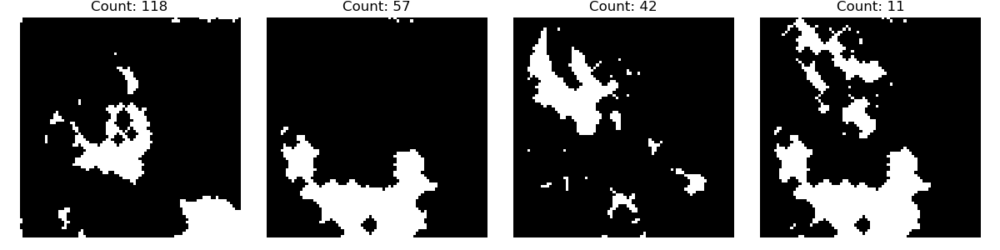

In [59]:
sorted_items = sorted(named_counts_dict.items(), key=lambda x: x[1], reverse=True)

# Take the top 4 entries (if there are at least 4)
top_four_entries = sorted_items[:4]

# Initialize an array to store the top four intersection maps
top_four_intersections = []

# Iterate through the top four entries
for names, count in top_four_entries:
    # Convert cluster names back to indices
    indices = [cluster_label.index(name) for name in names]
    
    # Calculate the intersection using np.logical_and
    intersection = calculate_intersection(indices)
    
    # Append the intersection map to the list
    top_four_intersections.append(intersection)

# Convert the list of intersections into a 3D numpy array (shape: (4, height, width))
top_four_intersections_array = np.array(top_four_intersections)

# Print the shape of the resulting array (optional)
print(top_four_intersections_array.shape)

# If you want to visualize the maps
fig, axes = plt.subplots(1, 4, figsize=(12, 3))  # 1 row, 4 columns for the 4 maps
for i, intersection in enumerate(top_four_intersections):
    axes[i].imshow(intersection, cmap='gray')
    axes[i].axis('off')  # Hide axes
    axes[i].set_title(f"Count: {top_four_entries[i][1]}")  # Set title with the count

plt.tight_layout()
plt.show()

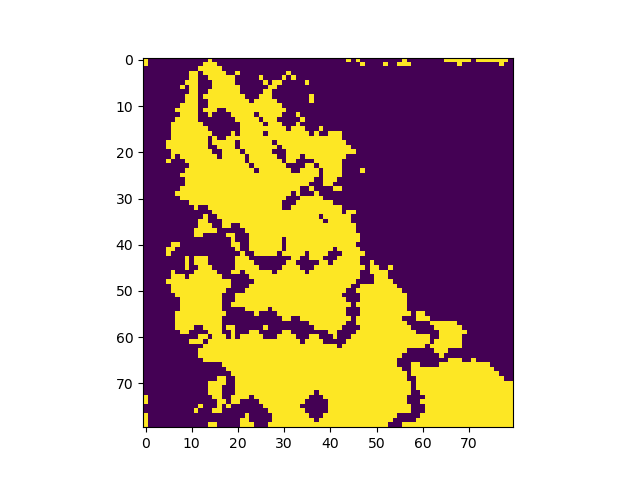

In [60]:
combined=top_four_intersections_array[0]
for i in range(1,len(top_four_intersections_array)):
    combined=np.logical_or(combined,top_four_intersections_array[i])
plt.figure()
plt.imshow(combined)

In [61]:
top_four_entries

[(('Si', 'O'), 118),
 (('K', 'Li', 'Rb', 'Al'), 57),
 (('Na', 'Al'), 42),
 (('K', 'Al'), 11)]

In [234]:
named_counts_dict

{('Si', 'O'): 14,
 ('Si', 'O', 'Al'): 85,
 ('O', 'Al'): 64,
 ('O', 'K', 'Li', 'Al'): 14,
 ('O', 'K', 'Li', 'Rb', 'Al'): 71,
 (): 5,
 ('O', 'K', 'Al'): 5,
 ('O', 'Na', 'Al'): 42,
 ('O', 'Li', 'Al'): 1}

### outra amostra

In [183]:
folder='C:/Users/Joana/Documents/Doutoramento/1 ano/spectral imaging/HDR/Amostra_sem_nome_HDR/'
filename = folder+"340_map"
def read_data_map(file):
 
    hf = h5py.File(file + '.h5', 'r')
    sample = file.split("\\")[-1]
    keys = [key for key in hf.keys()]
    sample = keys[0].split(' ')[-1]
 
    spectrums = np.array([np.ndarray.flatten(np.array(list(hf['Sample_ID: ' + sample]['Spot_' + str(i)]['Shot_0']['Pro']))) for i in range(0,
                                                        len(list(hf['Sample_ID: ' + sample])))])
    positions = np.array([np.ndarray.flatten(np.array(list(hf['Sample_ID: ' + sample]['Spot_' + str(i)]['position']))) for i in range(0,
                                                        len(list(hf['Sample_ID: ' + sample])))])
    wavelengths = np.array(hf['System properties']['wavelengths'])
 
   
    unique_x = np.unique(positions[:,0])
    unique_y = np.unique(positions[:,1])
   
    nx = len(unique_x)
    ny = len(unique_y)
    indexes = np.lexsort((positions[:, 0],positions[:, 1]))
    spectrums = spectrums[indexes, :]
    spectrums = np.array(spectrums.reshape((ny, nx, -1)))
    # print(spectrums.shape)
    positions = np.array(positions[indexes])
   
    hf.close()
    return spectrums, wavelengths, positions, unique_x, unique_y


spectrum, wavelengths, positions,unique_x,unique_y = read_data_map(filename)

pro_data = 1*spectrum

pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec
mask = pro_data_norm[:, :, :].reshape(pro_data.shape[0]*pro_data.shape[1], -1)

threshold = 5e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in tqdm(range(mask_offset.shape[-1]))])


100%|██████████| 16384/16384 [00:12<00:00, 1343.80it/s]


In [1]:
mask_t.shape

NameError: name 'mask_t' is not defined

In [185]:
maps=mask_t.reshape(-1,spectrum.shape[0],spectrum.shape[1])

In [186]:
edge_maps=[]
for w in tqdm(range(maps.shape[0])):
    current_map=maps[w,:,:]*255
    edges = feature.canny(current_map,sigma=1.5)
    edge_maps.append(edges)
edge_maps=np.array(edge_maps)

100%|██████████| 16384/16384 [00:17<00:00, 919.20it/s] 


In [187]:
texture_maps=[]

for w in tqdm(range(maps.shape[0])):
    current_map=maps[w,:,:]
    filt_real, filt_imag = gabor(current_map, frequency=0.6) #lower f, more sensitivty to detail
    texture_maps.append(filt_real)
texture_maps=np.array(texture_maps)

100%|██████████| 16384/16384 [00:22<00:00, 735.82it/s]


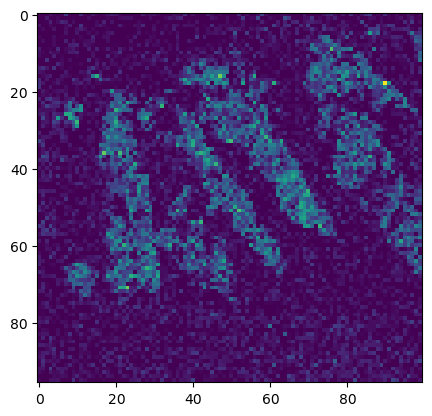

In [188]:
plt.figure()
plt.imshow(maps[find_index(wavelengths,670.22),:,:])

In [189]:
np.mean(maps,axis=(1,2)).shape

(16384,)

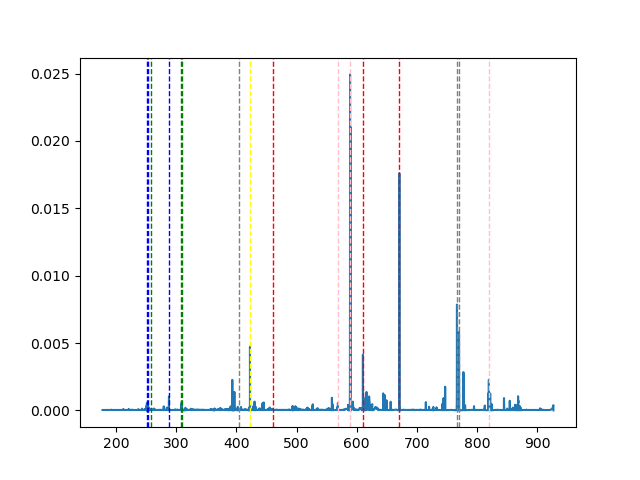

In [190]:
%matplotlib widget
plt.figure()
plt.plot(wavelengths.flatten(),np.mean(maps,axis=(1,2)))

plt.axvline(670.76,linestyle='--',color='red',lw=1,label='Li')
plt.axvline(610.22,linestyle='--',color='red',lw=1)
plt.axvline(460.28,linestyle='--',color='red',lw=1)

plt.axvline(588.95,linestyle='--',color='pink',lw=1,label='Na')
plt.axvline(568.77,linestyle='--',color='pink',lw=1)
plt.axvline(819.40,linestyle='--',color='pink',lw=1)

plt.axvline(288.16,linestyle='--',color='blue',lw=1,label='Si')
plt.axvline(251.59,linestyle='--',color='blue',lw=1)
plt.axvline(252.82,linestyle='--',color='blue',lw=1)


plt.axvline(309.25,linestyle='--',color='green',lw=1,label='Al')
plt.axvline(308.17,linestyle='--',color='green',lw=1)
plt.axvline(257.48,linestyle='--',color='green',lw=1)

plt.axvline(766.48,linestyle='--',color='gray',lw=1,label='K')
plt.axvline(769.89,linestyle='--',color='gray',lw=1)
plt.axvline(404.41,linestyle='--',color='gray',lw=1)

plt.axvline(422.8,linestyle='--',color='yellow',lw=1,label='background line')




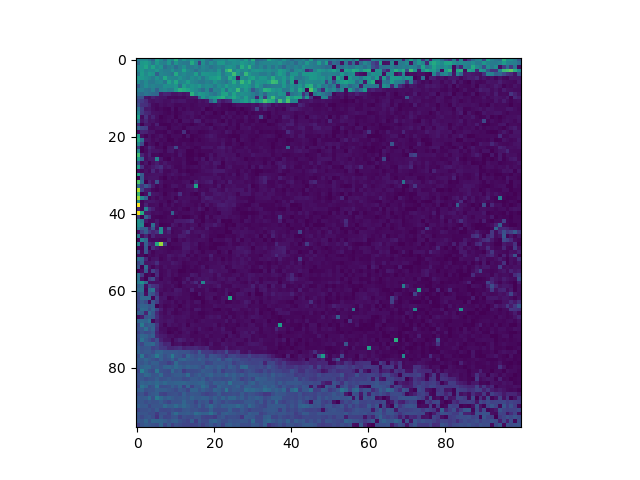

In [191]:
plt.figure()
plt.imshow(maps[find_index(wavelengths,422.8),:,:])

In [192]:
print(np.mean(texture_maps))

4.156931e-06


In [204]:
new_features=maps*800+texture_maps*1000+edge_maps*0.5

kmeans = sklearn.cluster.KMeans(n_clusters = 12,random_state=0)

features=new_features.reshape(-1,maps.shape[1]*maps.shape[2])
a=kmeans.fit_predict(features)
labels = kmeans.labels_
clusters_c = np.array(kmeans.cluster_centers_)

c:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


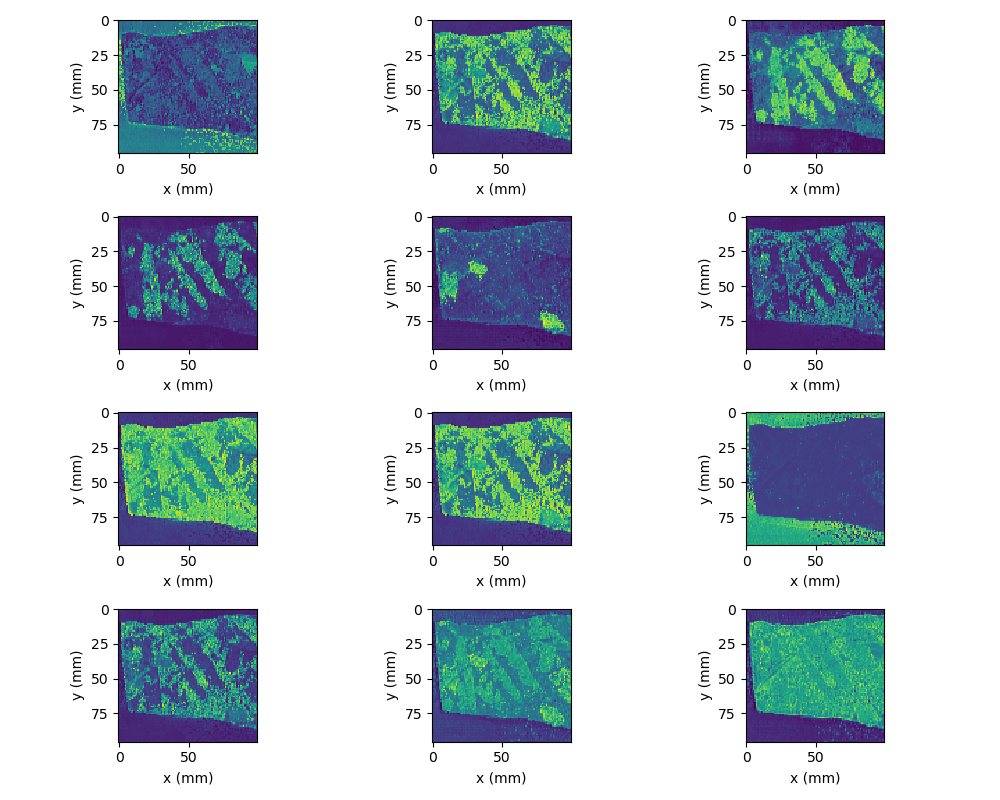

In [205]:
j = 0
l = 0
fig, ax = subplots(4, 3, figsize = (10, 8))
for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(maps.shape[1], maps.shape[2]), interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()    

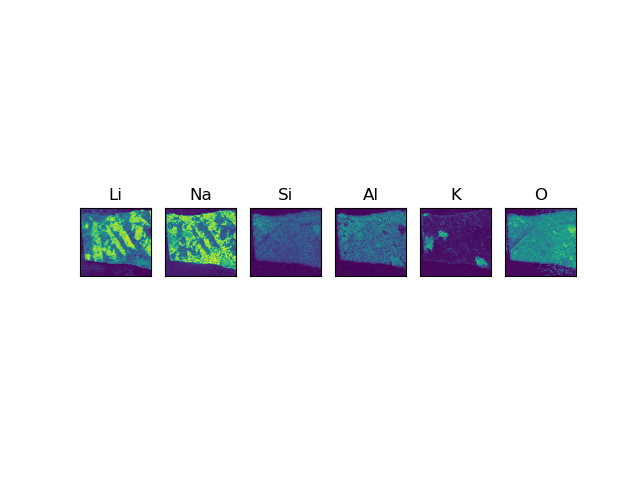

In [209]:
el=[670.76,588.95,288.16,309.25,766.48,777.194]
el_n=['Li','Na','Si','Al','K','O']
fig,ax=subplots(1,len(el))
for i in range(len(el)):
    ax[i].imshow(maps[find_index(wavelengths,el[i])])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(el_n[i])
    